In [1]:
import numpy as np
import datetime
import time
import os

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

# Set plot appearance
# See here for more options: https://matplotlib.org/users/customizing.html
%config InlineBackend.figure_format='retina'
sns.set() # Revert to matplotlib defaults
plt.rcParams['figure.figsize'] = (9, 6)
plt.rcParams['axes.labelpad'] = 10
sns.set_style("darkgrid")
# sns.set_context("poster", font_scale=1.0)

# Ignore warnings (for seaborn's kdeplot)
# import warnings
# warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'matplotlib'

In [ ]:
import warnings
warnings.filterwarnings('ignore')

---
# Human Resources Strategy
## Training a predictive model for employee attrition

Managing employee attrition is important and necessary to maintain retention (thereby manage high recruiting costs). Attrition affects employee morale and performance, which can have measurable consequence to the business. 

---

In [3]:
%%bash
head hr_data.csv

satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,quit,promotion_last_5years,is_smoker,department,salary
0.38,0.53,2,157,3,0,yes,0,,sales,low
0.8,0.86,5,262,6,0,yes,0,yes,sales,medium
0.11,0.88,7,272,4,0,yes,0,,sales,medium
0.72,0.87,5,223,5,0,yes,0,,sales,low
0.37,0.52,2,,,0,yes,0,no,sales,low
0.41,0.5,2,,,0,yes,0,,sales,low
0.1,0.77,6,247,4,0,yes,0,,sales,low
0.92,0.85,5,259,5,0,yes,0,,sales,low
0.89,1,5,224,5,0,yes,0,,sales,low


In [43]:
import pandas as pd

# Read in the data
hr = pd.read_csv('hr_data.csv')

In [121]:
type(hr)

pandas.core.frame.DataFrame

In [44]:
hr.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident', 'quit',
       'promotion_last_5years', 'is_smoker', 'department', 'salary'],
      dtype='object')

In [45]:
hr.head()

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,quit,promotion_last_5years,is_smoker,department,salary
0,0.38,0.53,2,157.0,3.0,0,yes,0,NaN,sales,low
1,0.80,0.86,5,262.0,6.0,0,yes,0,yes,sales,medium
2,0.11,0.88,7,272.0,4.0,0,yes,0,NaN,sales,medium
3,0.72,0.87,5,223.0,5.0,0,yes,0,NaN,sales,low
4,0.37,0.52,2,NaN,NaN,0,yes,0,no,sales,low


In [46]:
hr.tail()

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,quit,promotion_last_5years,is_smoker,department,salary
14995,0.37,0.48,2,160.0,3.0,0,yes,0,NaN,support,low
14996,0.37,0.53,2,143.0,3.0,0,yes,0,NaN,support,low
14997,0.11,0.96,6,280.0,4.0,0,yes,0,NaN,support,low
14998,0.37,0.52,2,158.0,3.0,0,yes,0,NaN,support,low
14999,0.90,0.75,6,228.0,4.0,0,yes,0,yes,management,high


In [47]:
# How many lines in the original CSV (including the header row)
with open('hr_data.csv') as f:
    print(len(f.read().splitlines()))

15001


In [48]:
# ... yet how many lines in the dataset
len(hr)

15000

Model objective will be the categorical variable `left` as our response. Let's explore it further. 

In [49]:
# How much missing data in the response target vaiable?
hr.quit.isnull().sum()

0

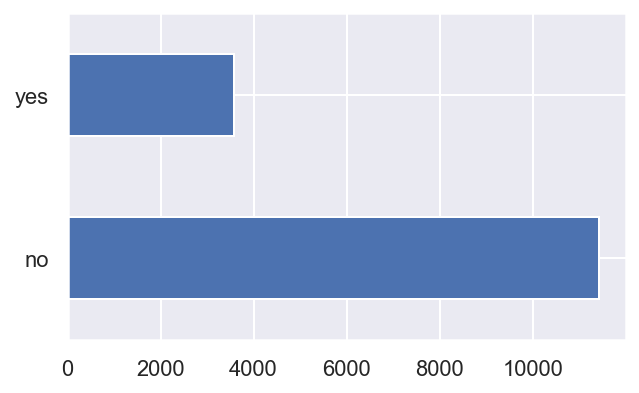

In [50]:
# Assess how this response variable `left` is distributed, visually
fig, ax = plt.subplots(figsize=(5, 3))
hr.quit.value_counts().plot(kind='barh');

In [51]:
# Dataset column types
hr.dtypes

satisfaction_level       float64
last_evaluation          float64
number_project             int64
average_monthly_hours    float64
time_spend_company       float64
work_accident              int64
quit                      object
promotion_last_5years      int64
is_smoker                 object
department                object
salary                    object
dtype: object

In [52]:
hr.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
satisfaction_level,15000.0,0.612853,0.248633,0.09,0.44,0.64,0.82,1.0
last_evaluation,15000.0,0.716104,0.171164,0.36,0.56,0.72,0.87,1.0
number_project,15000.0,3.803200,1.232682,2.00,3.00,4.00,5.00,7.0
average_monthly_hours,14632.0,200.960224,50.001098,96.00,156.00,200.00,245.00,310.0
time_spend_company,14849.0,3.494175,1.458933,2.00,3.00,3.00,4.00,10.0
work_accident,15000.0,0.144600,0.351709,0.00,0.00,0.00,0.00,1.0
promotion_last_5years,15000.0,0.021267,0.144277,0.00,0.00,0.00,0.00,1.0


In [122]:
hr.describe()

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,quit,promotion_last_5years,department_IT,department_RandD,...,department_product_mng,department_sales,department_support,department_technical,salary_high,salary_low,salary_medium,first_principle_component,second_principle_component,third_principle_component
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,...,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,1.500000e+04,1.500000e+04,1.500000e+04
mean,0.612853,0.716104,3.803200,200.994268,3.489200,0.144600,0.238133,0.021267,0.081800,0.052467,...,0.060133,0.276000,0.148600,0.181333,0.082533,0.487733,0.429733,-2.089625e-17,-7.159662e-16,1.205869e-16
std,0.248633,0.171164,1.232682,49.491248,1.452409,0.351709,0.425955,0.144277,0.274069,0.222974,...,0.237742,0.447032,0.355706,0.385307,0.275185,0.499866,0.495054,6.763447e-01,4.872923e-01,4.055766e-01
min,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.773400e-01,-5.660628e-01,-6.774702e-01
25%,0.440000,0.560000,3.000000,156.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.707015e-01,-3.337294e-01,-1.104780e-01
50%,0.640000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.533377e-02,-1.660079e-01,8.911577e-02
75%,0.820000,0.870000,5.000000,244.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,7.427945e-01,7.526010e-01,1.261908e-01
max,1.000000,1.000000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.794228e-01,7.797849e-01,7.580862e-01


In [53]:
# This is important. Modify the data to convert Categorical variables as such.
hr.quit = pd.Categorical(hr.quit)
hr.dtypes

satisfaction_level        float64
last_evaluation           float64
number_project              int64
average_monthly_hours     float64
time_spend_company        float64
work_accident               int64
quit                     category
promotion_last_5years       int64
is_smoker                  object
department                 object
salary                     object
dtype: object

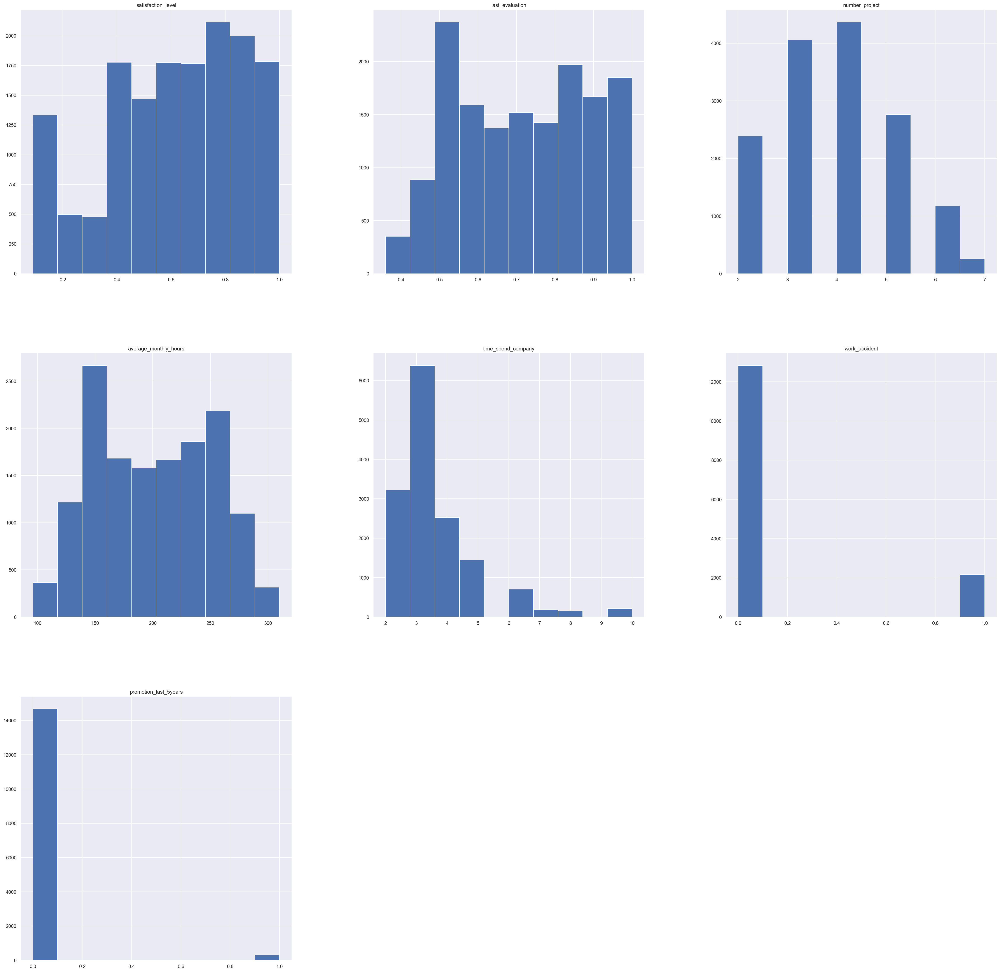

In [54]:
# Plot histograms for each variable
hr.hist(figsize = (40, 40))
plt.show()

## If necessary, toggle the scroll window in the main menu of the notebook: 
## Cell -> Current Outputs -> Toggle Scrolling

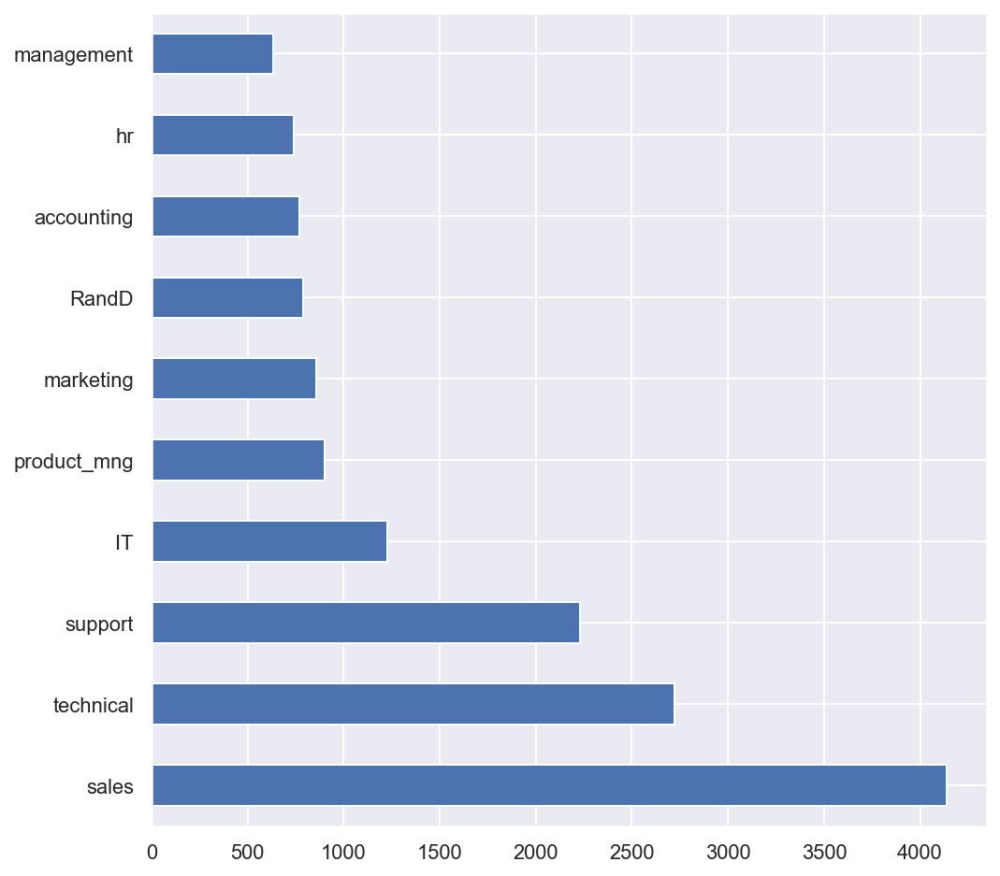

In [55]:
hr.department.value_counts().plot(kind='barh');

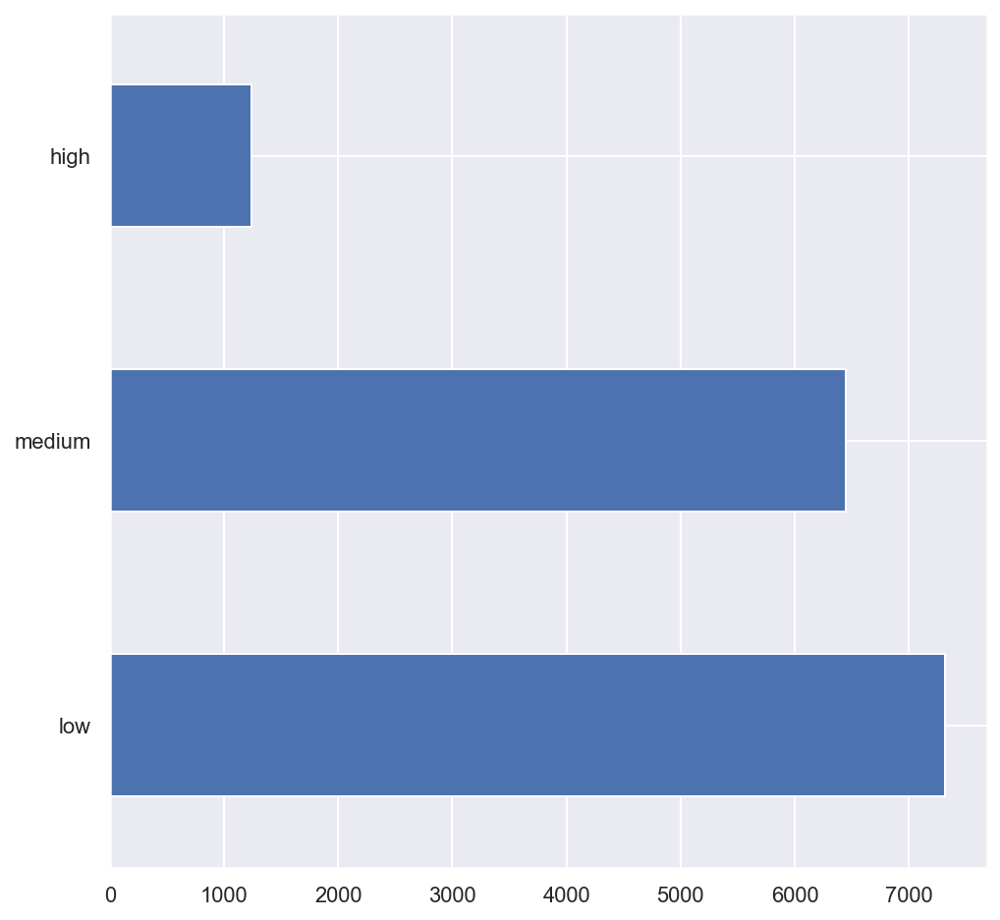

In [56]:
hr.salary.value_counts().plot(kind='barh');

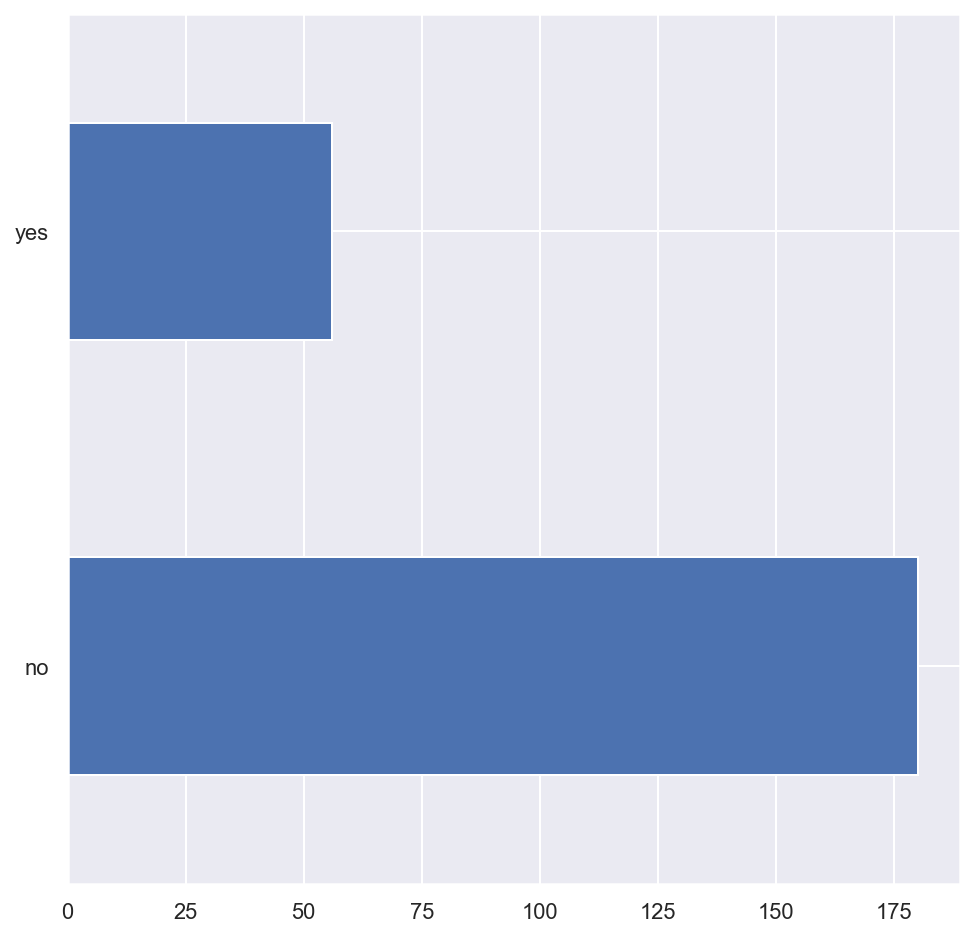

In [57]:
hr.is_smoker.value_counts().plot(kind='barh');

In [ ]:
import pandas_profiling

pandas_profiling.ProfileReport(hr)

---

## Feature engineering

#1 `is_smoker`

In [59]:
# Confirm is_smoker has far too many NaN's compared to the other features
hr.isnull().sum() / len(hr) * 100

satisfaction_level        0.000000
last_evaluation           0.000000
number_project            0.000000
average_monthly_hours     2.453333
time_spend_company        1.006667
work_accident             0.000000
quit                      0.000000
promotion_last_5years     0.000000
is_smoker                98.426667
department                0.000000
salary                    0.000000
dtype: float64

In [60]:
# Remove is_smoker feature
del hr['is_smoker']

#2 `time_spend_company` has 1% missing values. Let's assume that a reasonable method for "fixing" these missing values is to replace it with the median of its other values. 

In [61]:
fill_value = hr.time_spend_company.median()
hr.time_spend_company = hr.time_spend_company.fillna(fill_value)

In [62]:
hr.isnull().sum() / len(hr) * 100

satisfaction_level       0.000000
last_evaluation          0.000000
number_project           0.000000
average_monthly_hours    2.453333
time_spend_company       0.000000
work_accident            0.000000
quit                     0.000000
promotion_last_5years    0.000000
department               0.000000
salary                   0.000000
dtype: float64

#3 finally, we can make a smarter adjustment to resolve the missing vales in `average_montly_hours`

<AxesSubplot:xlabel='number_project', ylabel='average_monthly_hours'>

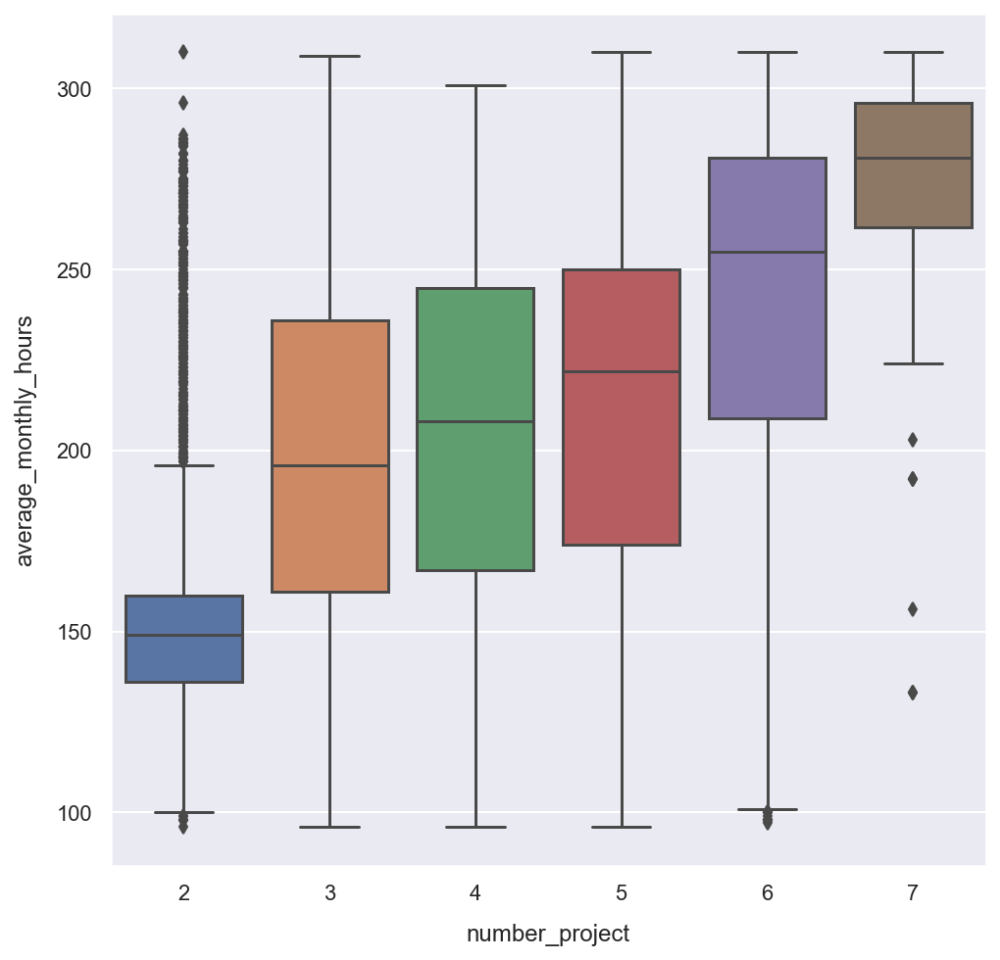

In [63]:
# How does average_monthly_hours depend on number_project?

sns.boxplot(x='number_project', y='average_monthly_hours', data=hr)

In [64]:
# Calculate fill values for average_montly_hours

mean_per_project = hr.groupby('number_project')\
                    .average_monthly_hours.mean()
mean_per_project = dict(mean_per_project)
mean_per_project

{2: 160.16353543979506,
 3: 197.47882323104236,
 4: 205.07858315740089,
 5: 211.99962839093274,
 6: 238.73006134969324,
 7: 276.015873015873}

In [65]:
# Fill average_monthly_hours with the appropriate values

fill_values_hours = hr.number_project.map(mean_per_project)

In [66]:
fill_values_hours.describe()

count    15000.000000
mean       200.994268
std         22.439560
min        160.163535
25%        197.478823
50%        205.078583
75%        211.999628
max        276.015873
Name: number_project, dtype: float64

In [67]:
hr.average_monthly_hours = hr.average_monthly_hours.fillna(fill_values_hours)

In [68]:
hr.average_monthly_hours.describe()

count    15000.000000
mean       200.994268
std         49.491248
min         96.000000
25%        156.000000
50%        200.000000
75%        244.000000
max        310.000000
Name: average_monthly_hours, dtype: float64

In [69]:
# Confirm that we are all clear of NaN's -- if True, `assert` should not give an error 
assert hr.isnull().sum().sum() == 0

In [70]:
# Convert categorical features of the response variable `left` to a binary integer representation
hr.quit = hr.quit.map({'no': 0, 'yes': 1})

In [71]:
hr.quit.value_counts()

0    11428
1     3572
Name: quit, dtype: int64

This next step involving one-hot encoding is especially important for Deep Learning, as neural network activation functions require numeric values. 

In [33]:
# One-hot encoding --> convert the other categorical features `department` & `salary` into binary integers matrices  
hr = pd.get_dummies(hr)

In [34]:
hr.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'quit_0', 'quit_1', 'department_IT',
       'department_RandD', 'department_accounting', 'department_hr',
       'department_management', 'department_marketing',
       'department_product_mng', 'department_sales', 'department_support',
       'department_technical', 'salary_high', 'salary_low', 'salary_medium'],
      dtype='object')

In [35]:
hr.head()

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,promotion_last_5years,quit_0,quit_1,department_IT,...,department_hr,department_management,department_marketing,department_product_mng,department_sales,department_support,department_technical,salary_high,salary_low,salary_medium
0,0.38,0.53,2,157.000000,3.0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
1,0.80,0.86,5,262.000000,6.0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,1
2,0.11,0.88,7,272.000000,4.0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,1
3,0.72,0.87,5,223.000000,5.0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0
4,0.37,0.52,2,160.163535,3.0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,1,0


In [36]:
# Save to file
hr.to_csv('hr_data_processed.csv', index=False)

---
## Building Classification Models

In [72]:
# Set default figure size
plt.rcParams['figure.figsize'] = (8, 8)

### Bivariate plots to see interactions between select feature variables (using Seaborn)

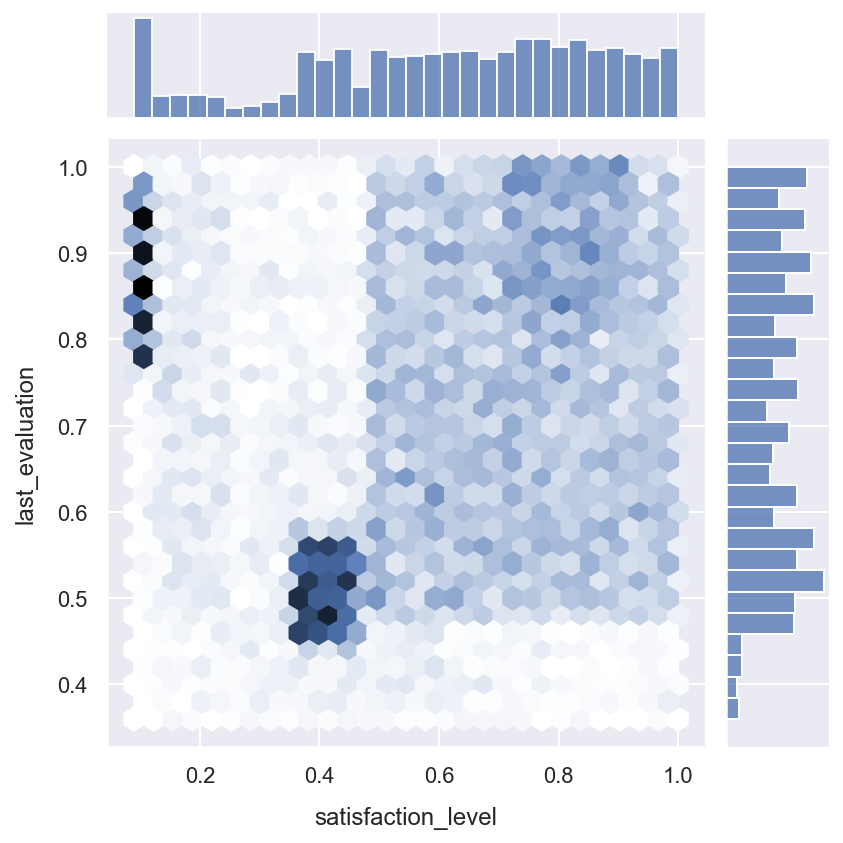

In [73]:
# The two features we'll use for training in this section
sns.jointplot('satisfaction_level', 'last_evaluation', data=hr, kind='hex')

Text(0.25, 1.05, 'quit = 1')

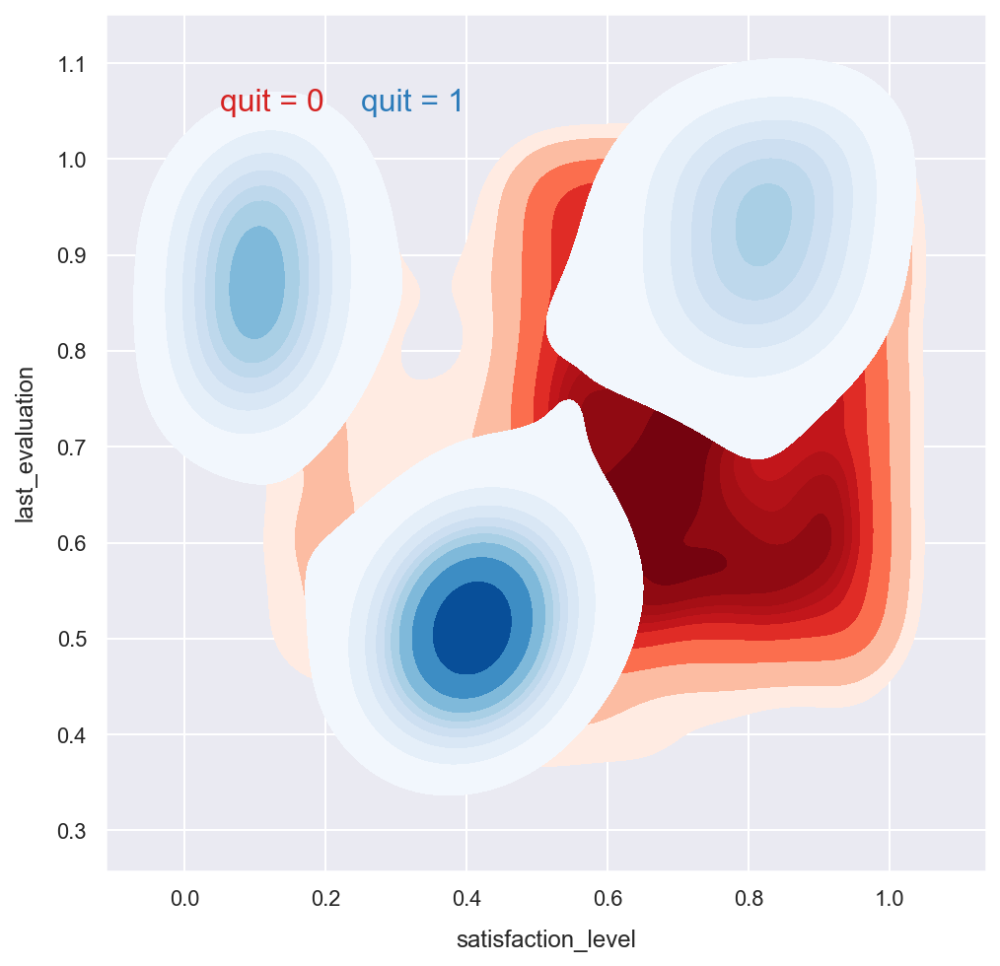

In [74]:
# segment the above plot with the response variable `quit`
fig, ax = plt.subplots()
plot_args = dict(shade=True, shade_lowest=False)
for i, c in zip((0, 1), ('Reds', 'Blues')):
    sns.kdeplot(hr.loc[hr.quit==i, 'satisfaction_level'],
                hr.loc[hr.quit==i, 'last_evaluation'],
                cmap=c, **plot_args)
ax.text(0.05, 1.05, 'quit = 0', size=16, color=sns.color_palette('Reds')[-2])
ax.text(0.25, 1.05, 'quit = 1', size=16, color=sns.color_palette('Blues')[-2])

Text(0.25, 1.05, 'quit = 1')

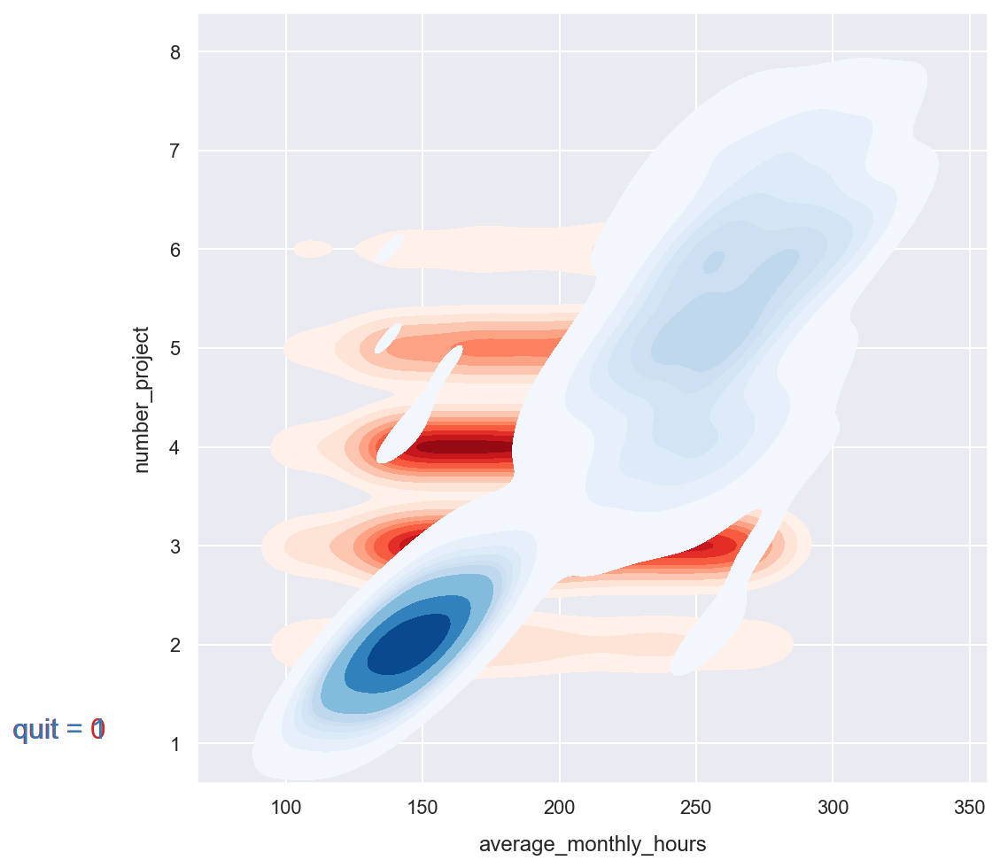

In [75]:
# segment the above plot with the response variable `quit`
fig, ax = plt.subplots()
plot_args = dict(shade=True, shade_lowest=False)
for i, c in zip((0, 1), ('Reds', 'Blues')):
    sns.kdeplot(hr.loc[hr.quit==i, 'average_monthly_hours'],
                hr.loc[hr.quit==i, 'number_project'],
                cmap=c, **plot_args)
ax.text(0.05, 1.05, 'quit = 0', size=16, color=sns.color_palette('Reds')[-2])
ax.text(0.25, 1.05, 'quit = 1', size=16, color=sns.color_palette('Blues')[-2])

In [76]:
# Split the data into training and testing sets

from sklearn.model_selection import train_test_split

features = ['satisfaction_level', 'last_evaluation']
X_train, X_test, y_train, y_test = train_test_split(
    hr[features].values, hr['quit'].values,
    test_size=0.15, random_state=42)

In [77]:
len(X_test)

2250

In [78]:
# Scale the data for SVMs and K-Nearest Neighbors

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [79]:
# Train a support vector machine classifier (SVC)

from sklearn.svm import SVC

svm = SVC(kernel='linear', C=1, random_state=42)
svm.fit(X_train_std, y_train)

SVC(C=1, kernel='linear', random_state=42)

In [80]:
# What is this SVC's classification accuracy?

from sklearn.metrics import accuracy_score

y_pred = svm.predict(X_test_std)
acc = accuracy_score(y_test, y_pred)
print('accuracy = {:.1f}%'.format(acc*100))

accuracy = 76.8%


We predict the targets for our test samples and then use scikit-learn's accuracy_score function to determine the accuracy. 

The result looks promising at ~76%! Not bad for our first model. Recall, though, the target variable is imbalanced between left = 0 & 1. Let's see how accurate the predictions are for each class.

In [81]:
# What is this SVC's accuracy by class, i.e., by `quit` categories? While this metric sounds simple, it is a statistically questionable concept. 

from sklearn.metrics import confusion_matrix

print('percent accuracy score per class:')
cmat = confusion_matrix(y_test, y_pred)
scores = cmat.diagonal() / cmat.sum(axis=1) * 100
print('left = 0 : {:.2f}%'.format(scores[0]))
print('left = 1 : {:.2f}%'.format(scores[1]))

percent accuracy score per class:
left = 0 : 100.00%
left = 1 : 0.00%


Terrible - it looks like the model is simply classifying every sample as 0, which is clearly not helpful at all. 

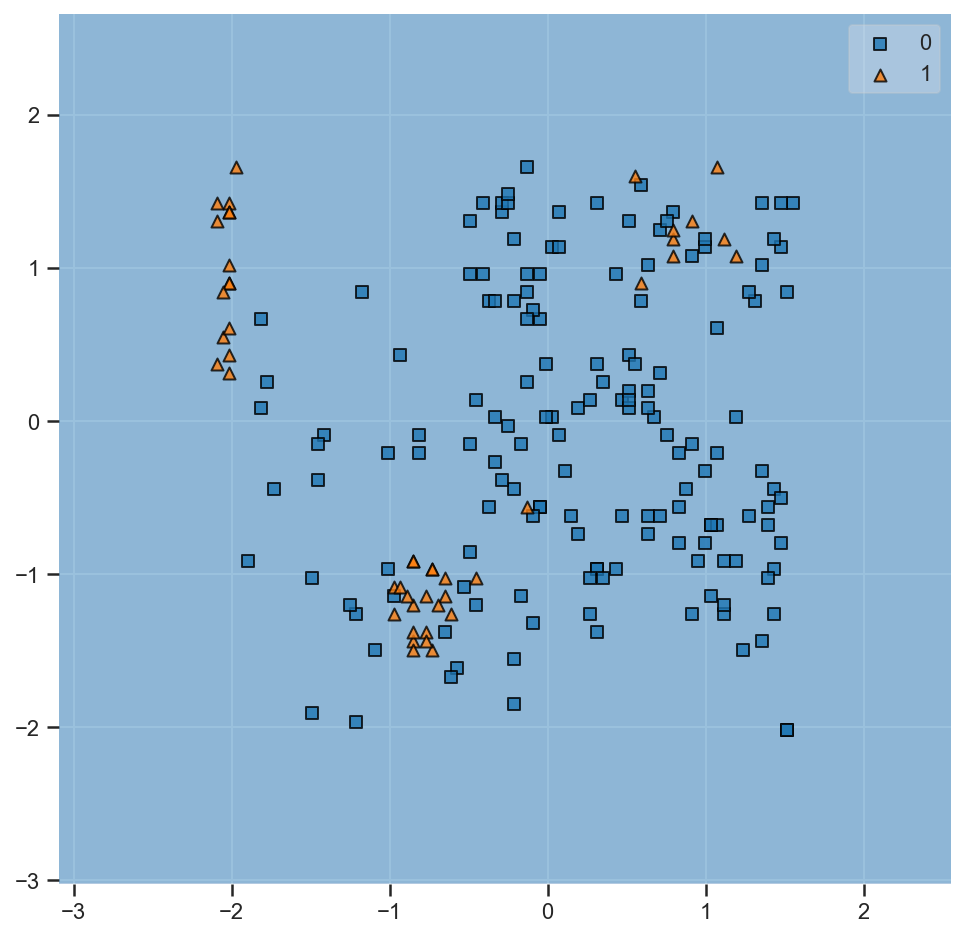

In [82]:
# Plot the resulting decision regions

from mlxtend.plotting import plot_decision_regions

N_samples = 200
X, y = X_train_std[:N_samples], np.array(y_train[:N_samples])
plot_decision_regions(X, y, clf=svm);

The `mlxtend` package plots decision regions along with a set of samples passed as arguments. In order to see the decision regions properly without too many samples obstructing our view, we pass only a 200-sample subset of the test data to its `plot_decision_regions` function. 

<p>In this case, of course, it does not matter. We see the resulting shaded region is <i>entirely</i> blue, indicating every point in the feature space would be classified as 0.

It shouldn't be surprising that a linear model can't do a good job of describing these nonlinear patterns. So let's re-run the SVC with `kernel = 'rbf'`, <i>i.e.</i>, we are running the support vector classifier (SVC) using its  radial basis function kernel (RBF). 

In [83]:
# Train a kernel SVM

svm = SVC(kernel='rbf', C=1, random_state=1)
svm.fit(X_train_std, y_train)

SVC(C=1, random_state=1)

In [84]:
# What is this kernel SVM's classification accuracy? Compare with SVC accuracy score above. 

from sklearn.metrics import accuracy_score

y_pred = svm.predict(X_test_std)
acc = accuracy_score(y_test, y_pred)
print('accuracy = {:.1f}%'.format(acc*100))

accuracy = 90.4%


As expected, the nonlinear parameter performs much better than linear for our data. Keep in mind that `rbf` is often called a kernel trick with SVCs to get better model performance. Now let's plot the results visually.

In [85]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from IPython.display import display
from mlxtend.plotting import plot_decision_regions

def check_model_fit(clf, X_test, y_test):
    # Print overall test-set accuracy
    y_pred = clf.predict(X_test)
    acc = accuracy_score(y_test, y_pred, normalize=True) * 100
    print('total accuracy = {:.1f}%'.format(acc))
    
    # Print confusion matrix
    cmat = confusion_matrix(y_test, y_pred)
    cols = pd.MultiIndex.from_tuples([('predictions', 0), ('predictions', 1)])
    indx = pd.MultiIndex.from_tuples([('actual', 0), ('actual', 1)])
    display(pd.DataFrame(cmat, columns=cols, index=indx))
    print()
    
    # Print test-set accuracy grouped by the target variable 
    print('percent accuracy score per class:')
    cmat = confusion_matrix(y_test, y_pred)
    scores = cmat.diagonal() / cmat.sum(axis=1) * 100
    print('left = 0 : {:.2f}%'.format(scores[0]))
    print('left = 1 : {:.2f}%'.format(scores[1]))
    print()
    
    # Plot decision regions
    fig = plt.figure(figsize=(8, 8))
    N_samples = 200
    X, y = X_test[:N_samples], y_test[:N_samples]
    plot_decision_regions(X, y, clf=clf)
    
    plt.xlabel('satisfaction_level')
    plt.ylabel('last_evaluation')
    plt.legend(loc='upper left')

total accuracy = 90.4%


predictions     
                   0    1
actual 0        1683   46
       1         169  352


percent accuracy score per class:
left = 0 : 97.34%
left = 1 : 67.56%



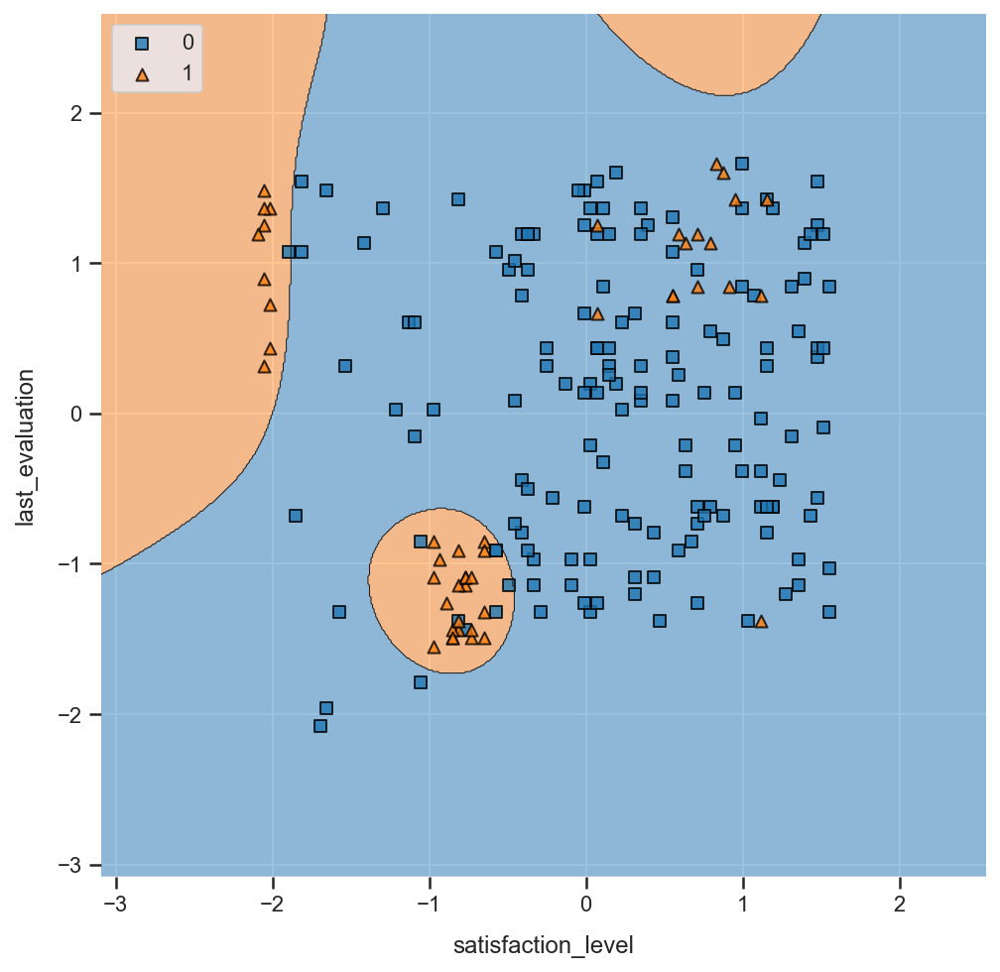

In [86]:
check_model_fit(svm, X_test_std, np.array(y_test))

### Building a K-Nearest Neighbors (KNN) Classifier

total accuracy = 91.1%


predictions     
                   0    1
actual 0        1642   87
       1         114  407


percent accuracy score per class:
left = 0 : 94.97%
left = 1 : 78.12%



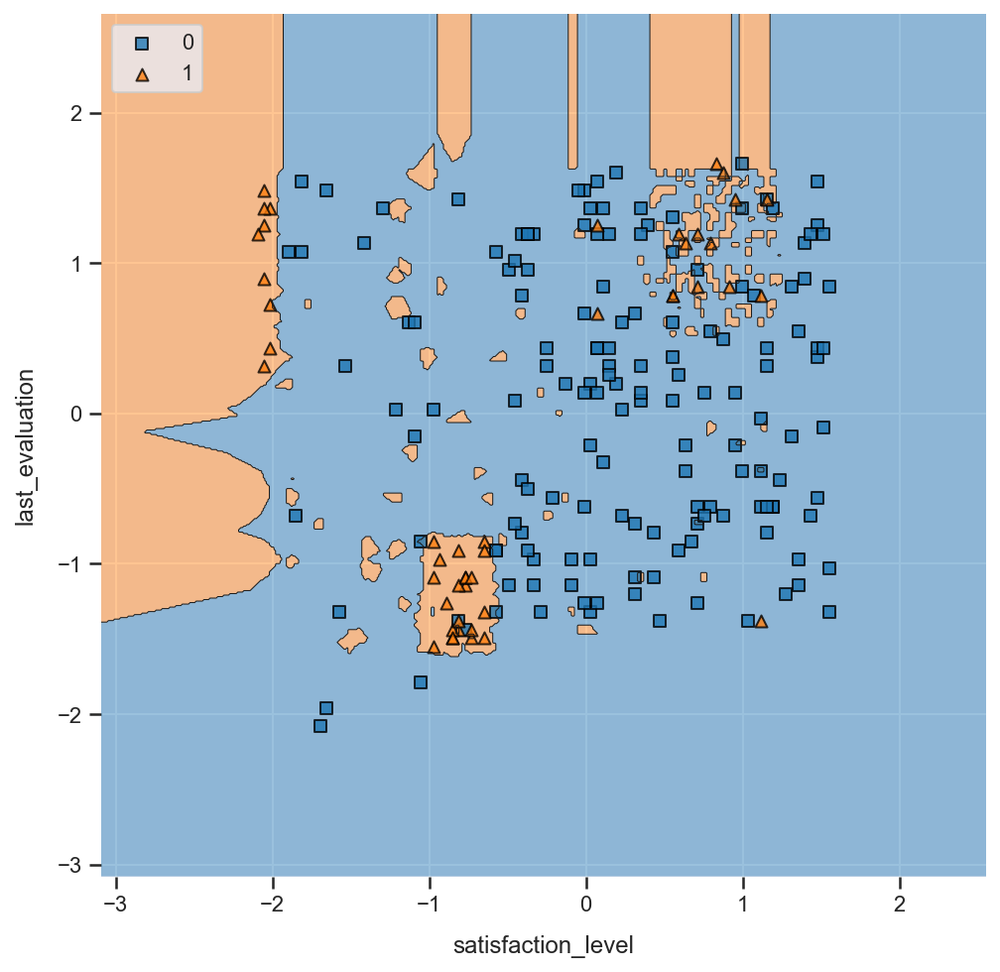

In [87]:
from sklearn.neighbors import KNeighborsClassifier

# Train a K-Nearest Neighbors model

knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_std, y_train)

check_model_fit(knn, X_test_std, np.array(y_test))

total accuracy = 91.6%


predictions     
                   0    1
actual 0        1667   62
       1         126  395


percent accuracy score per class:
left = 0 : 96.41%
left = 1 : 75.82%



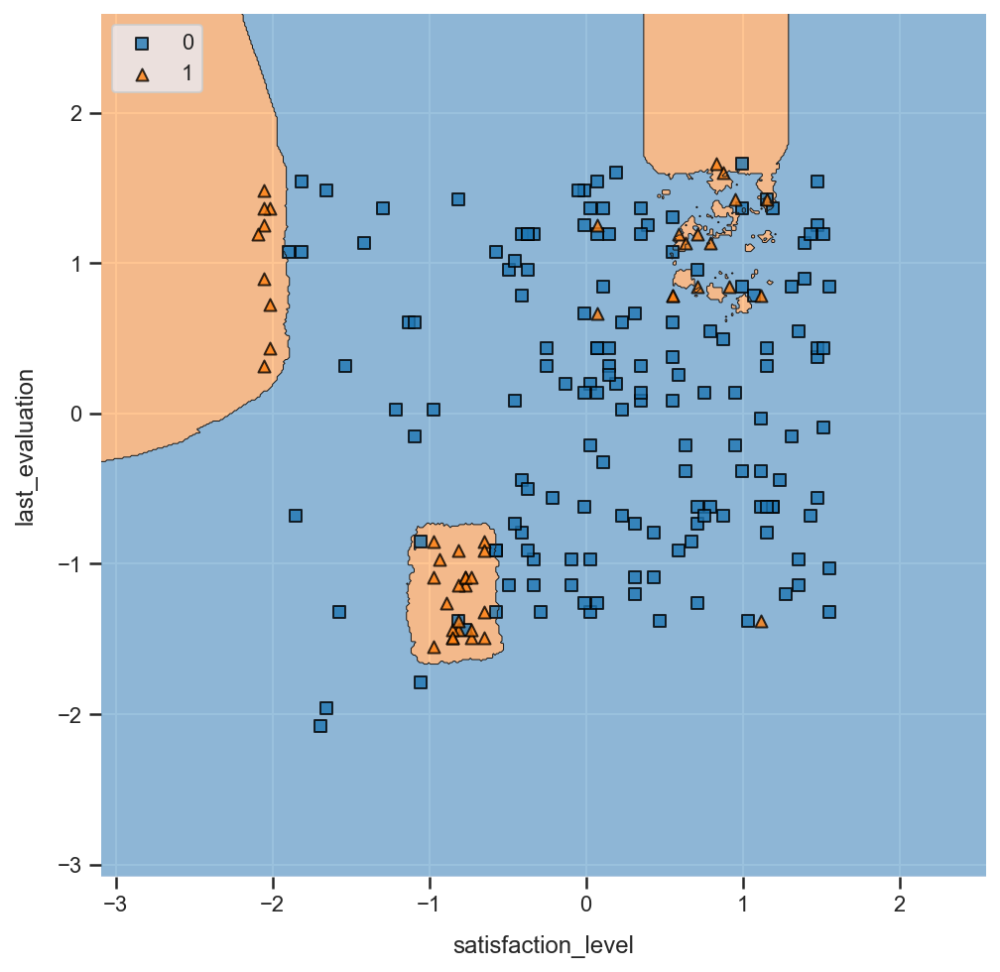

In [88]:
# Increase the number of "nearest neighbors" to reduce overfitting

knn = KNeighborsClassifier(n_neighbors=25)
knn.fit(X_train_std, y_train)

check_model_fit(knn, X_test_std, np.array(y_test))

### Training a Random Forest

total accuracy = 91.9%


predictions     
                   0    1
actual 0        1705   24
       1         159  362


percent accuracy score per class:
left = 0 : 98.61%
left = 1 : 69.48%



(0.2, 1.2)

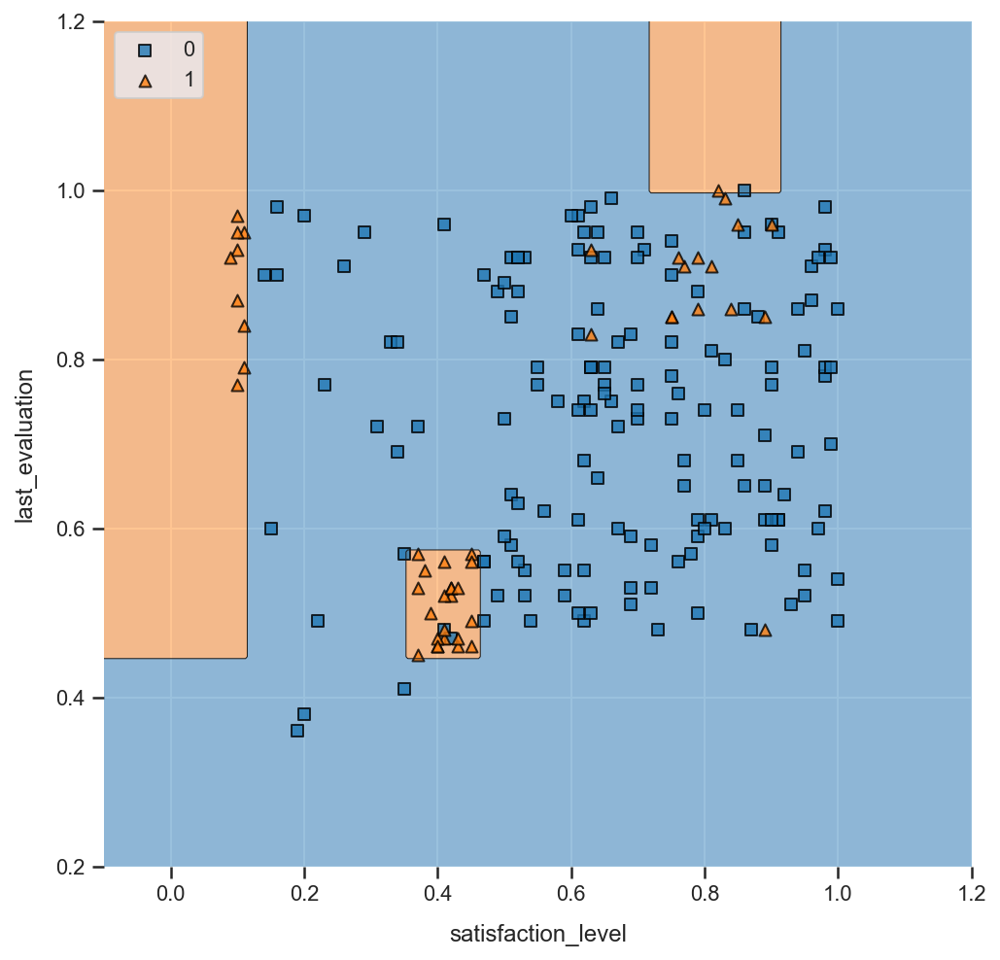

In [89]:
from sklearn.ensemble import RandomForestClassifier

forest = RandomForestClassifier(n_estimators=50, max_depth=5,
                                random_state=1)
forest.fit(X_train, y_train)

check_model_fit(forest, X_test, np.array(y_test))
plt.xlim(-0.1, 1.2)
plt.ylim(0.2, 1.2)

Note the distinctive axes-parallel decision boundaries produced by decision tree machine learning algorithms.

In [ ]:
# DO NOT RUN THIS CELL -- `graphviz` package just cannot be installed on OS X Mojave
from sklearn.tree import export_graphviz
import pydot
from IPython.display import Image, display
import graphviz

dot_data = export_graphviz(
                forest.estimators_[0],
                out_file=None, 
                feature_names=features,  
                class_names=['no', 'yes'],  
                filled=True, rounded=True,  
                special_characters=True)
graph = graphviz.Source(dot_data)
graph

In [ ]:
from IPython.display import Image
Image("Graphviz_hr_image051.png")

In [ ]:
Image("Graphviz_hr_image050.png")

---

## Training and Testing the Classification Algorithms

Now that we have preprocessed the data and built our training and testing datasets, we can start to deploy different classification algorithms. It's relatively easy to test multiple models; as a result, we will compare and contrast the performance of ten different algorithms.

In [90]:
hr = pd.read_csv('HR_pre-processed.csv')

In [91]:
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   satisfaction_level      15000 non-null  float64
 1   last_evaluation         15000 non-null  float64
 2   number_project          15000 non-null  int64  
 3   average_monthly_hours   15000 non-null  float64
 4   time_spend_company      15000 non-null  float64
 5   work_accident           15000 non-null  int64  
 6   quit                    15000 non-null  int64  
 7   promotion_last_5years   15000 non-null  int64  
 8   department_IT           15000 non-null  int64  
 9   department_RandD        15000 non-null  int64  
 10  department_accounting   15000 non-null  int64  
 11  department_hr           15000 non-null  int64  
 12  department_management   15000 non-null  int64  
 13  department_marketing    15000 non-null  int64  
 14  department_product_mng  15000 non-null

In [92]:
hr.head()

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,quit,promotion_last_5years,department_IT,department_RandD,...,department_hr,department_management,department_marketing,department_product_mng,department_sales,department_support,department_technical,salary_high,salary_low,salary_medium
0,0.38,0.53,2,157.000000,3.0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,1,0
1,0.80,0.86,5,262.000000,6.0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
2,0.11,0.88,7,272.000000,4.0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,0,1
3,0.72,0.87,5,223.000000,5.0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,1,0
4,0.37,0.52,2,160.163535,3.0,0,1,0,0,0,...,0,0,0,0,1,0,0,0,1,0


In [93]:
# Create X and Y datasets for training
# Select training/validation set

features = ['satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department_IT', 'department_RandD',
       'department_accounting', 'department_hr', 'department_management',
       'department_marketing', 'department_product_mng', 'department_sales',
       'department_support', 'department_technical', 'salary_high',
       'salary_low', 'salary_medium']

X = hr[features].values
y = hr.quit.values

In [94]:
# Simpler code to split the training test set
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

In [95]:
# Use the model_selection module to separate training and testing datasets
from sklearn import model_selection


# define seed for reproducibility
seed = 42

# split data into training and testing datasets
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.15, random_state=seed)

<i>Cell below is self-contained. Discuss live using saved output, because running it takes 8 minutes due to neural network! 

In [96]:
%%time
# Now that we have our dataset, we can start building algorithms! We'll need to import each algorithm we plan on using
# from sklearn.  We also need to import some performance metrics, such as accuracy_score and classification_report.

from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score

from xgboost import XGBClassifier

# define scoring method
scoring = 'accuracy'

# Define models to train
#names = ["Nearest Neighbors", "Gaussian Process",
#         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
#         "Naive Bayes", "SVM Linear", "SVM RBF", "SVM Sigmoid"]

names = ["Nearest Neighbors",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "XGBoost"]

#classifiers = [
#    KNeighborsClassifier(n_neighbors = 8),
#    GaussianProcessClassifier(1.0 * RBF(1.0)),
#    DecisionTreeClassifier(max_depth=9),
#    RandomForestClassifier(max_depth=9, n_estimators=10, max_features=1),
#    MLPClassifier(alpha=10, solver='lbfgs', hidden_layer_sizes=[100], max_iter=2000, activation='logistic'),
#    AdaBoostClassifier(),
#    GaussianNB(),
#    SVC(kernel = 'linear', gamma='auto'), 
#    SVC(kernel = 'rbf', gamma='auto'),
#    SVC(kernel = 'sigmoid', gamma='auto')
#]

classifiers = [
    KNeighborsClassifier(n_neighbors = 8),
    DecisionTreeClassifier(max_depth=9),
    RandomForestClassifier(max_depth=9, n_estimators=10, max_features=1),
    MLPClassifier(alpha=10, solver='lbfgs', hidden_layer_sizes=[100], max_iter=2000, activation='logistic'),
    AdaBoostClassifier(),
    GaussianNB(),
    XGBClassifier()
]


models = list(zip(names, classifiers))

# evaluate each model in turn
results = []
names = []

print("Accuracy cross-validation average (with standard deviation) for each model -")
for name, model in models:
    kfold = model_selection.KFold(n_splits=10, random_state = seed)
    cv_results = model_selection.cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

Accuracy cross-validation average (with standard deviation) for each model -


ValueError: Setting a random_state has no effect since shuffle is False. You should leave random_state to its default (None), or set shuffle=True.

In [97]:
names

[]

In [98]:
from sklearn.metrics import roc_auc_score, roc_curve
from matplotlib import pyplot

# Remember, performance on the training data is not that important. We want to know how well our algorithms
# can generalize to new data.  To test this, let's make predictions on the validation dataset.

for name, model in list(models):
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    print(name)
    print('Accuracy on test split: %.5f' % accuracy_score(y_test, predictions))
    score = roc_auc_score(y_test, predictions)
    print('AUC: %.4f' % score)
    print(classification_report(y_test, predictions))

# Accuracy - ratio of correctly predicted observation to the total observations. 

# Precision - (false positives) ratio of correctly predicted positive observations to the total predicted 
# positive observations

# Recall (Sensitivity) - (false negatives) ratio of correctly predicted positive observations to the all 
# observations in actual class - yes.

# F1 score - F1 Score is the weighted average of Precision and Recall. Therefore, this score takes both 
# false positives and false 

Nearest Neighbors
Accuracy on test split: 0.94667
AUC: 0.9291
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      1729
           1       0.88      0.90      0.89       521

    accuracy                           0.95      2250
   macro avg       0.92      0.93      0.93      2250
weighted avg       0.95      0.95      0.95      2250

Decision Tree
Accuracy on test split: 0.97689
AUC: 0.9581
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1729
           1       0.98      0.92      0.95       521

    accuracy                           0.98      2250
   macro avg       0.98      0.96      0.97      2250
weighted avg       0.98      0.98      0.98      2250

Random Forest
Accuracy on test split: 0.91822
AUC: 0.8268
              precision    recall  f1-score   support

           0       0.91      1.00      0.95      1729
           1       0.99      0.66      0.79       521

    

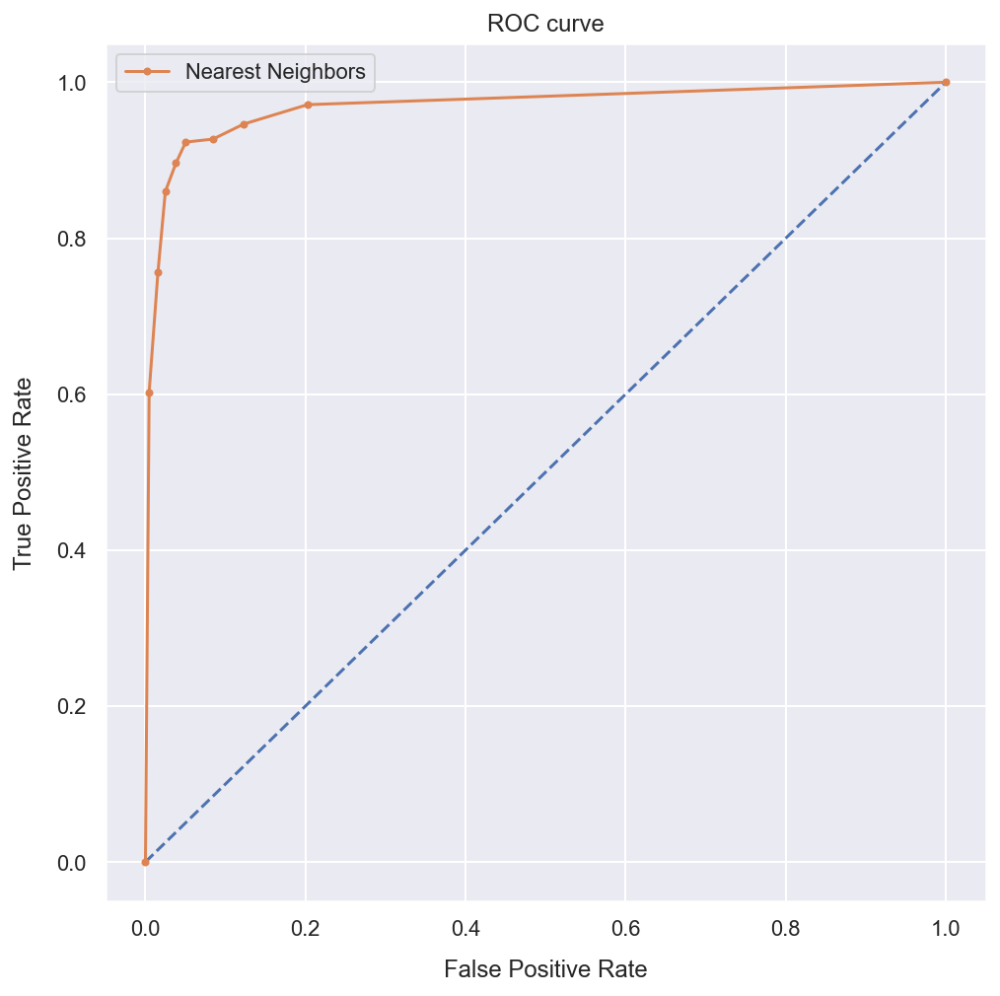

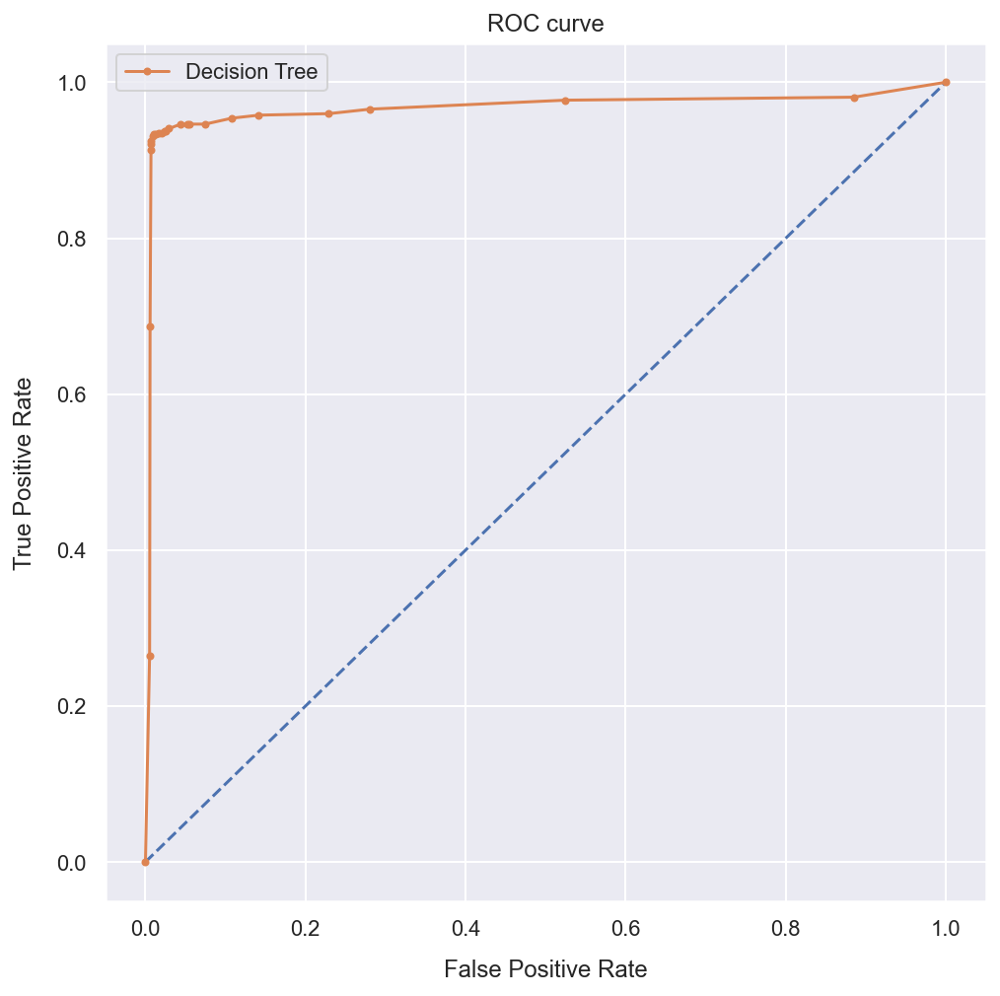

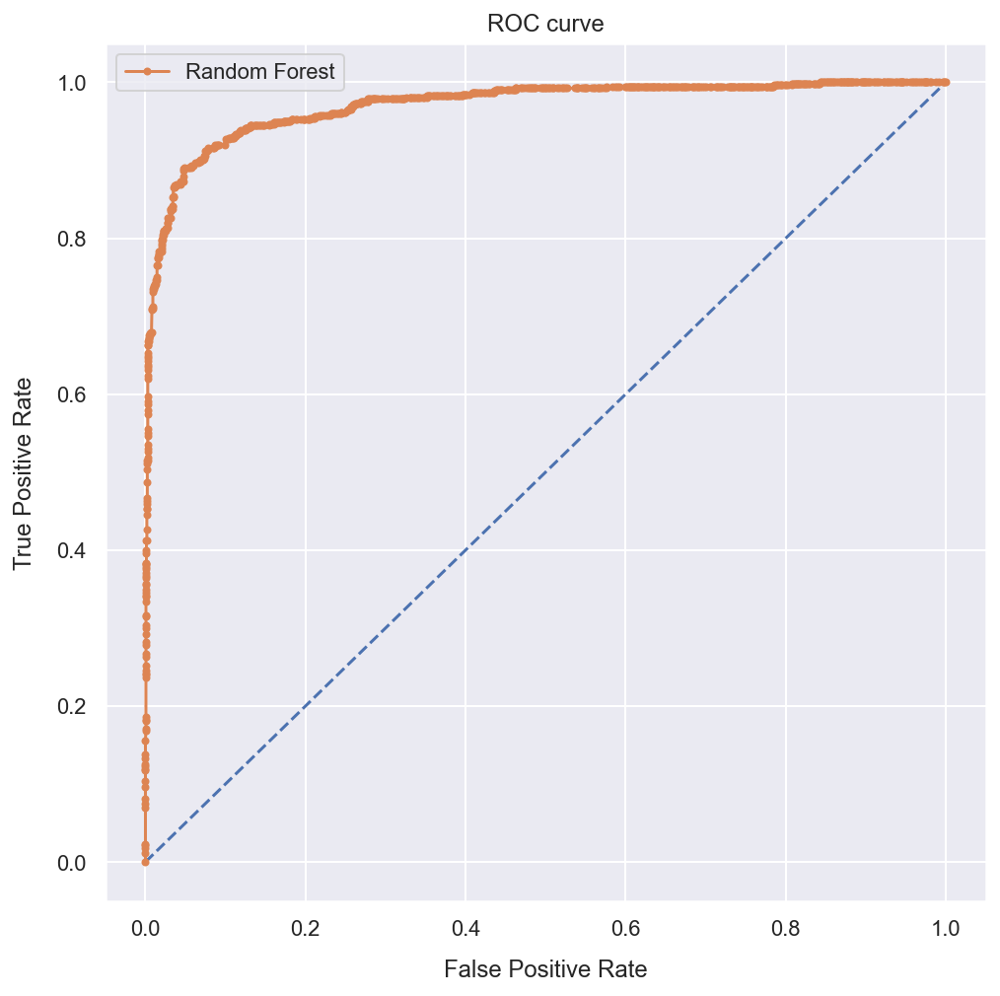

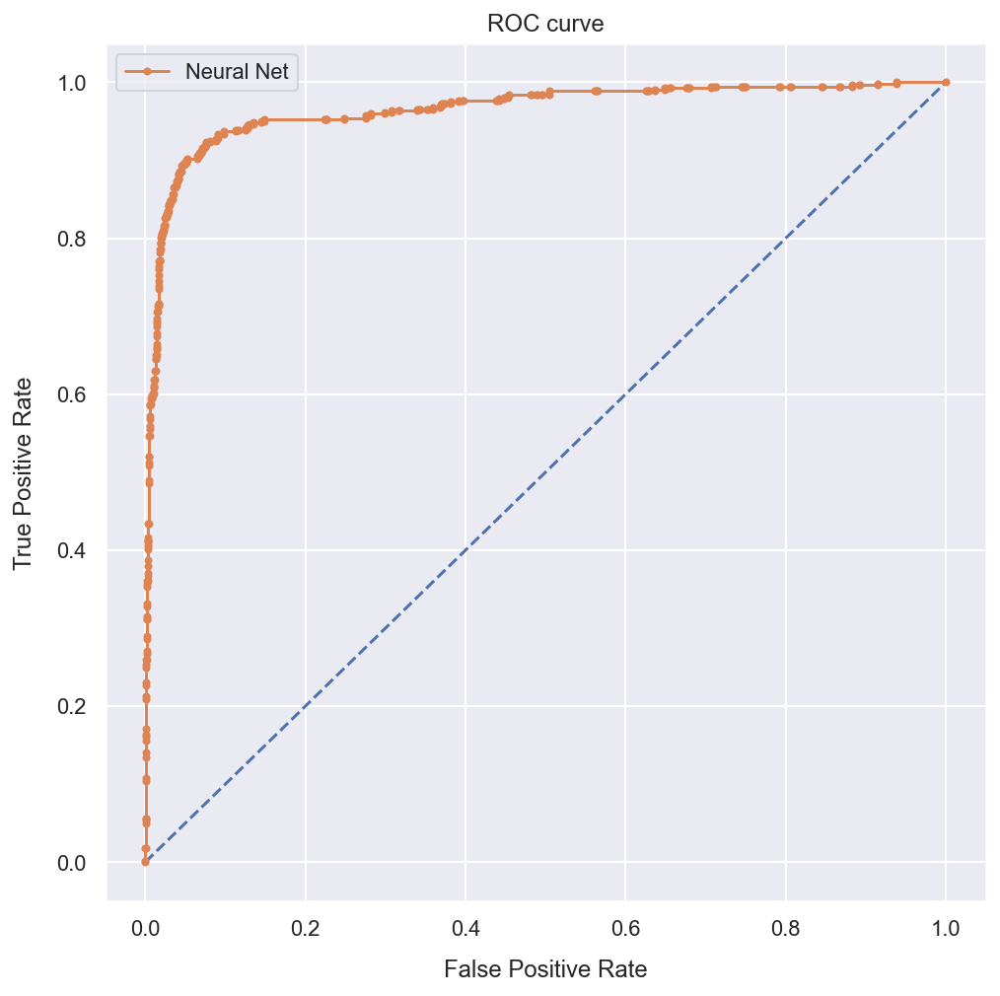

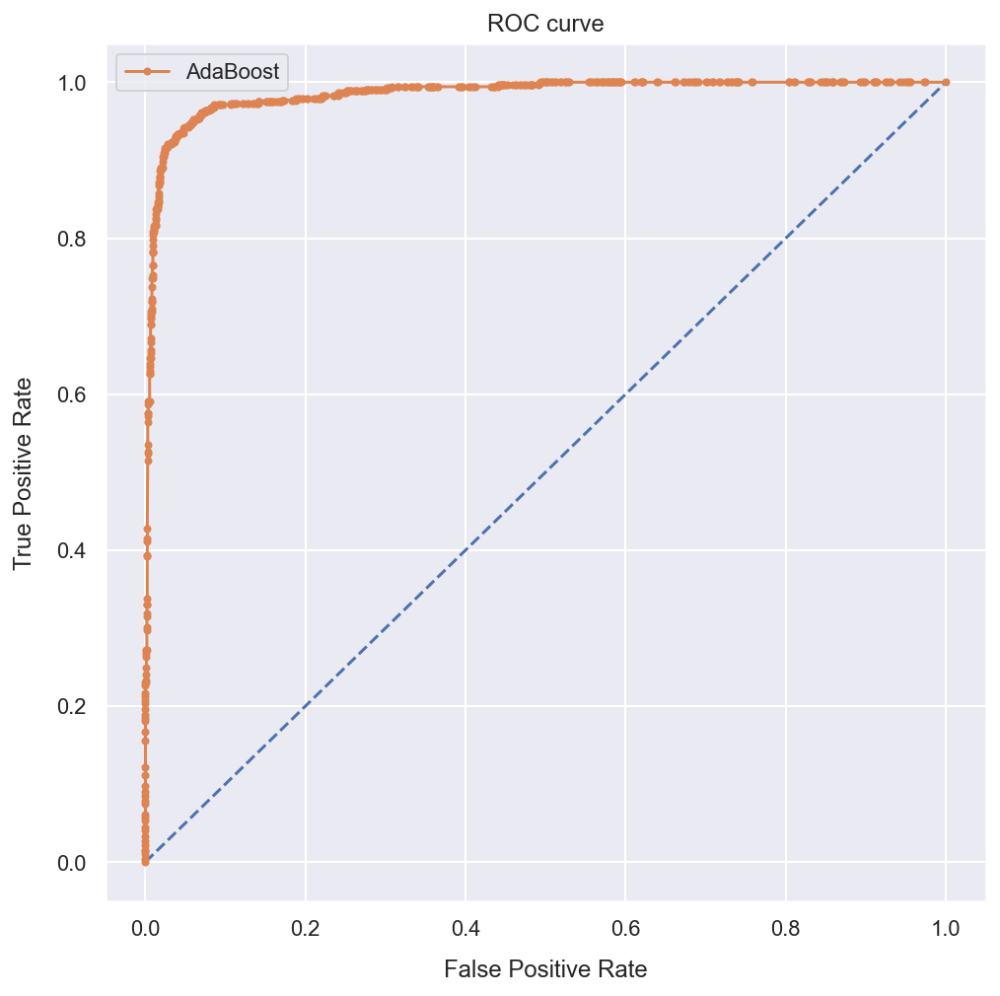

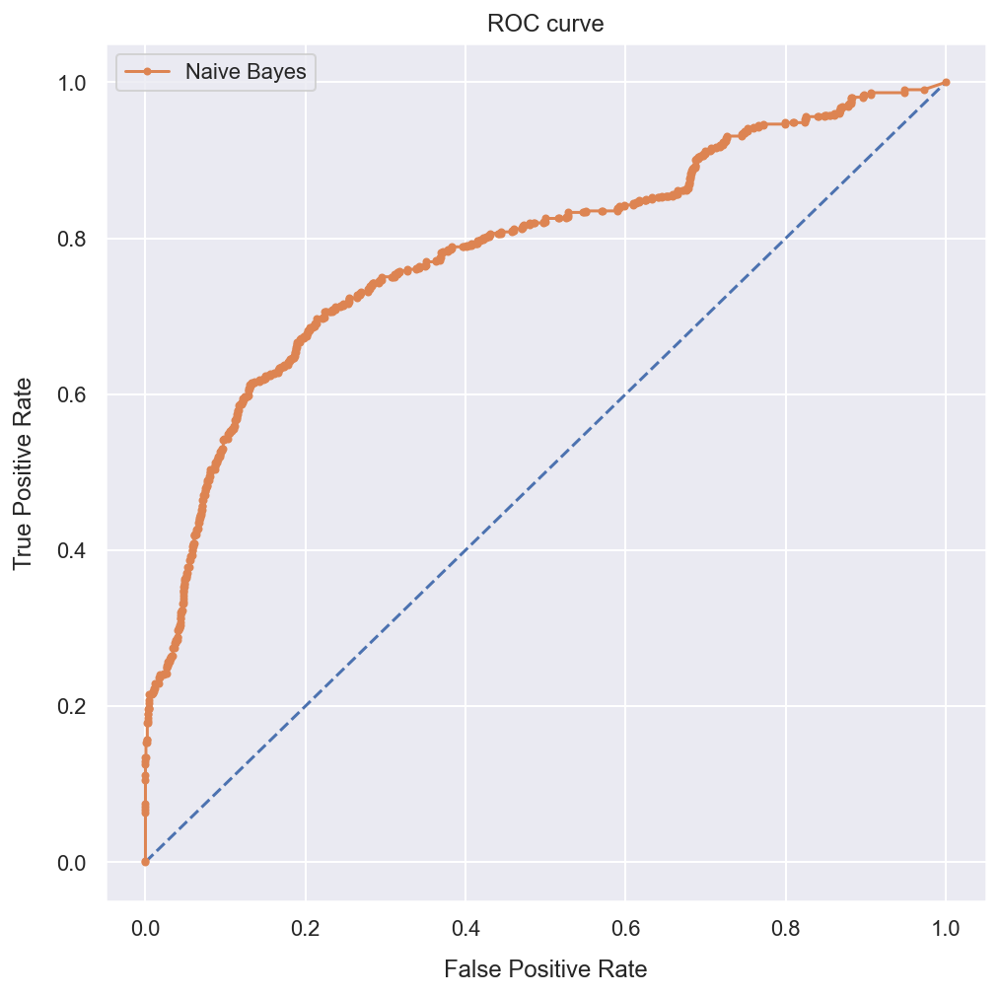

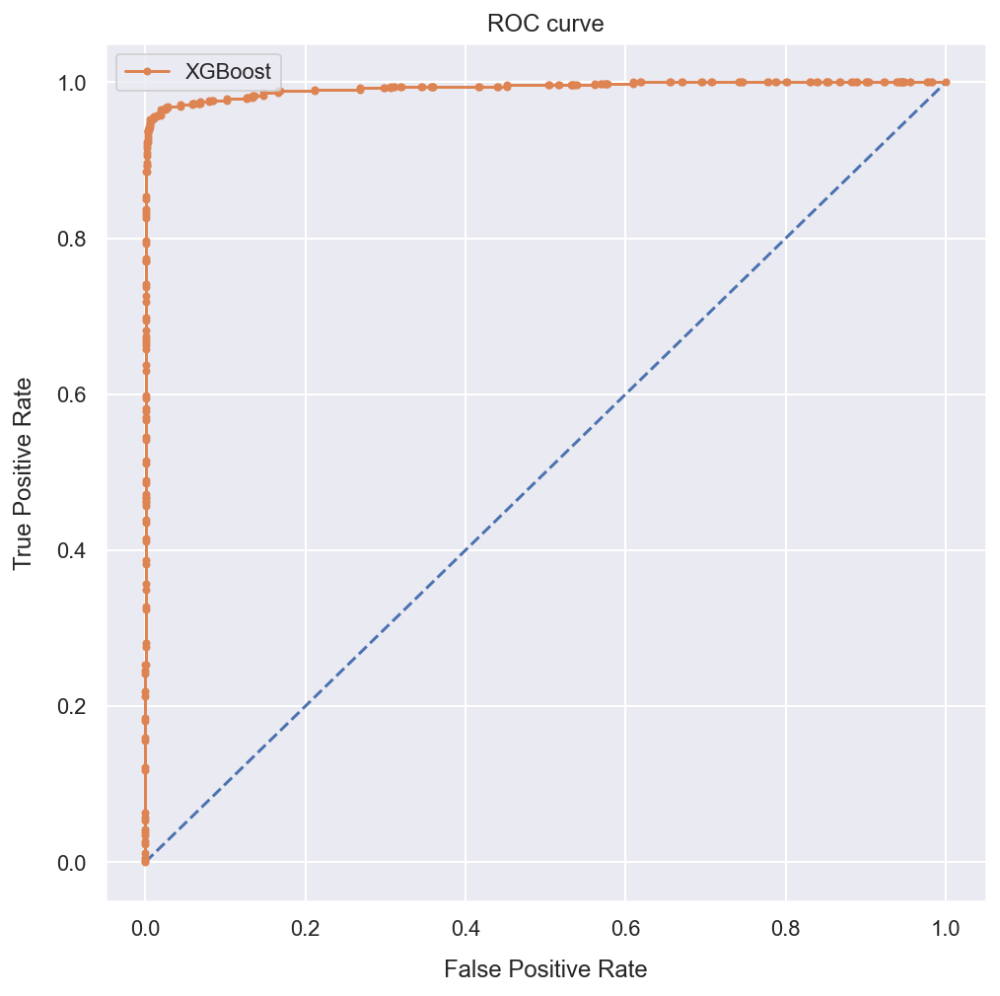

In [99]:
for name, model in list(models):
    prob_score = []
    # predict probabilities
    prob_score = model.predict_proba(X_test)
    # keep probabilities for the positive outcome only
    prob_score = prob_score[:, 0]
    fpr,tpr,thresholds = roc_curve(y_test,1-prob_score)
    # Plot the roc curve for this model
    pyplot.plot([0, 1], [0, 1], linestyle='--')
    # plot the roc curve for the model
    pyplot.plot(fpr, tpr, marker='.', label = name)
    plt.xlim([-.05, 1.05])
    plt.ylim([-.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC curve')
    plt.legend()
    pyplot.show()

--- 
## Building a full model

### Commentary
This is classic p-value hacking! Picking models this way makes it very easy to increase accuracy on a training dataset by overfitting a model, which can result in poorer performance on unseen data.

Furthermore, using only one training/test split to compare models can introduce bias towards certain models and contribute to overfitting.

<b>K-fold cross validation</b> offers a solution to this problem and allows the variance to be accounted for by way of an error estimate on each accuracy calculation. This, in turn, naturally leads to the use of validation curves for tuning model parameters.

In [100]:
# Function to draw the validation curve

def plot_validation_curve(train_scores, test_scores,
                          param_range, xlabel='', log=False):
    '''
    This code is from scikit-learn docs:
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_learning_curve.html
    
    Also here:
    https://github.com/rasbt/python-machine-learning-book-2nd-edition/blob/master/code/ch06/ch06.ipynb
    '''
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    fig = plt.figure()
    
    plt.plot(param_range, train_mean, 
             color=sns.color_palette('Set1')[1], marker='o', 
             markersize=5, label='training accuracy')

    plt.fill_between(param_range, train_mean + train_std,
                     train_mean - train_std, alpha=0.15,
                     color=sns.color_palette('Set1')[1])

    plt.plot(param_range, test_mean, 
             color=sns.color_palette('Set1')[0], linestyle='--', 
             marker='s', markersize=5, 
             label='validation accuracy')

    plt.fill_between(param_range, 
                     test_mean + test_std,
                     test_mean - test_std, 
                     alpha=0.15, color=sns.color_palette('Set1')[0])

    if log:
        plt.xscale('log')
    plt.legend(loc='lower right')
    if xlabel:
        plt.xlabel(xlabel)
    plt.ylabel('Accuracy')
    plt.ylim(0.9, 1.0)
    return fig

In [101]:
# Custom function for class accuracies

from sklearn.model_selection import StratifiedKFold

def cross_val_class_score(clf, X, y, cv=10):
    kfold = StratifiedKFold(n_splits=cv)\
                .split(X, y)

    class_accuracy = []
    for k, (train, test) in enumerate(kfold):
        clf.fit(X[train], y[train])
        y_test = y[test]
        y_pred = clf.predict(X[test])
        cmat = confusion_matrix(y_test, y_pred)
        class_acc = cmat.diagonal()/cmat.sum(axis=1)
        class_accuracy.append(class_acc)
        print('fold: {:d} accuracy: {:s}'.format(k+1, str(class_acc)))
        
    return np.array(class_accuracy)

In [102]:
# Select training/validation set

features = ['satisfaction_level', 'last_evaluation', 'number_project',
       'average_monthly_hours', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'department_IT', 'department_RandD',
       'department_accounting', 'department_hr', 'department_management',
       'department_marketing', 'department_product_mng', 'department_sales',
       'department_support', 'department_technical', 'salary_high',
       'salary_low', 'salary_medium']

X = hr[features].values
y = hr.quit.values

Random Forests are an attractive algorithm. For one thing, they're compatible with feature sets composed of both continuous and categorical data.

A Random Forest builds multiple decision trees and merges them together to get a more accurate and stable prediction. Very simplistically, random forests are a collection of decision tress (but with notable algorithmic  differences).  

In [103]:
%%time
# Calculate a validation curve for max_depth
# using a Random Forest classifier

np.random.seed(42)
from sklearn.model_selection import validation_curve
from sklearn.metrics import confusion_matrix

clf = RandomForestClassifier(n_estimators=20)
max_depths = [3, 4, 5, 6, 7,
              9, 12, 15, 18, 21]
print('Training {} models ...'.format(len(max_depths)))
train_scores, test_scores = validation_curve(
            estimator=clf,
            X=X,
            y=y,
            param_name='max_depth',
            param_range=max_depths,
            cv=5);

Training 10 models ...
CPU times: user 6.25 s, sys: 69.8 ms, total: 6.32 s
Wall time: 6.34 s


<b>Validation curves</b> are plots of a training and validation metric as a function of some model parameter. They plot the accuracy as a function of a hyperparameter, such as the number of decision trees used in a Random Forest or the max depth.

(3.0, 21.0)

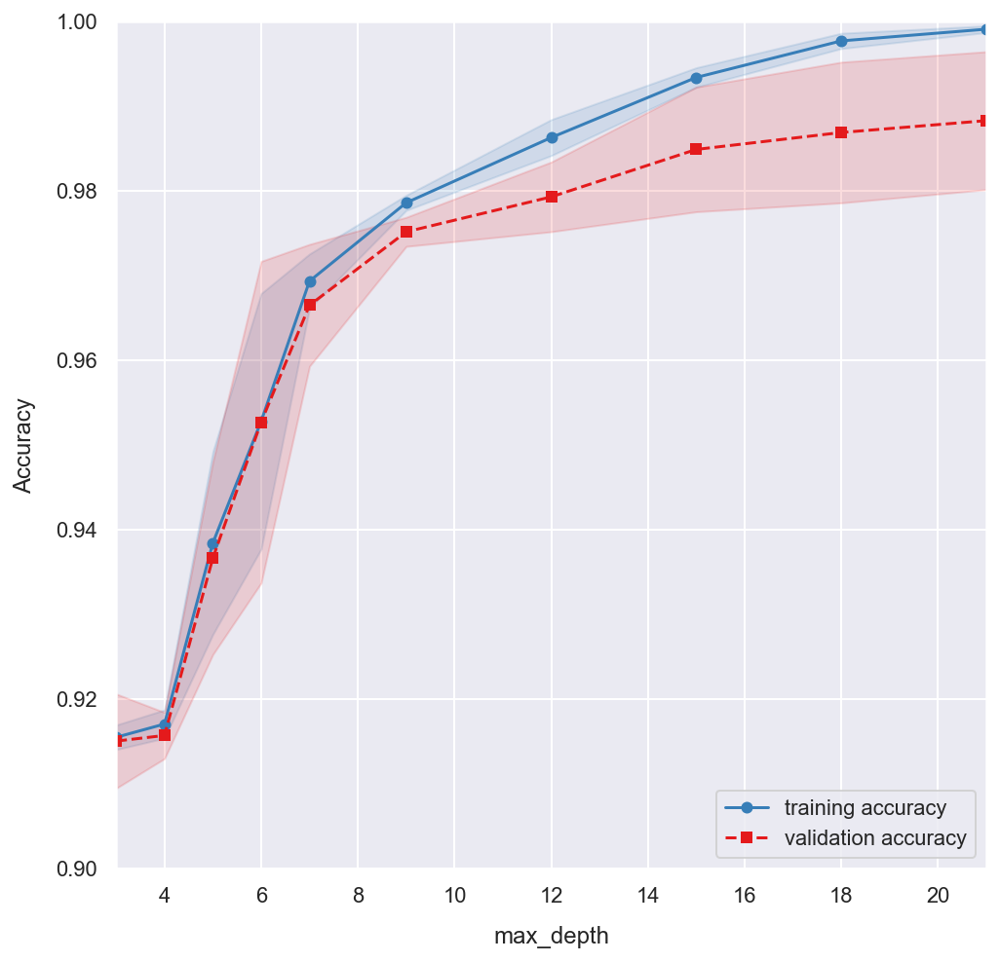

In [104]:
# Draw the validation curve

plot_validation_curve(train_scores, test_scores,
                      max_depths, xlabel='max_depth')
plt.xlim(3, 21)

#### Interpreting the validation curve
Starting on the left side of the plot, we see that both training & validation results <i>generally</i> align on the accuracy score, which is good. 

Taking max-depth to 6 or push up to 9, we can see a point/region where the error bars of these two accuracy lines no longer overlap. The optimal value for the max_depth parameter (<i>i.e.</i>, hyperparameter) can be found by looking for a high validation score with overlapping error bars on the two lines.

In [105]:
# Stratified k-fold cross validation
from sklearn.model_selection import cross_val_score

# Show k-fold results for the selected model:
# a random forest with max_depth = 6 or 9 and n_estimators = 200

np.random.seed(42)
clf = RandomForestClassifier(n_estimators=200, max_depth=6)
scores = cross_val_class_score(clf, X, y)

print('accuracy = {} +/- {}'.format(scores.mean(axis=0), scores.std(axis=0)))

fold: 1 accuracy: [0.99824869 0.89664804]
fold: 2 accuracy: [0.99824869 0.81284916]
fold: 3 accuracy: [0.99300087 0.83753501]
fold: 4 accuracy: [0.99300087 0.85434174]
fold: 5 accuracy: [0.99562555 0.80672269]
fold: 6 accuracy: [0.99387577 0.87955182]
fold: 7 accuracy: [0.99650044 0.87955182]
fold: 8 accuracy: [0.99650044 0.86554622]
fold: 9 accuracy: [0.99562555 0.87955182]
fold: 10 accuracy: [0.99825022 0.85154062]
accuracy = [0.99588771 0.85638389] +/- [0.0019579  0.02838983]


Text(0, 0.5, 'Accuracy')

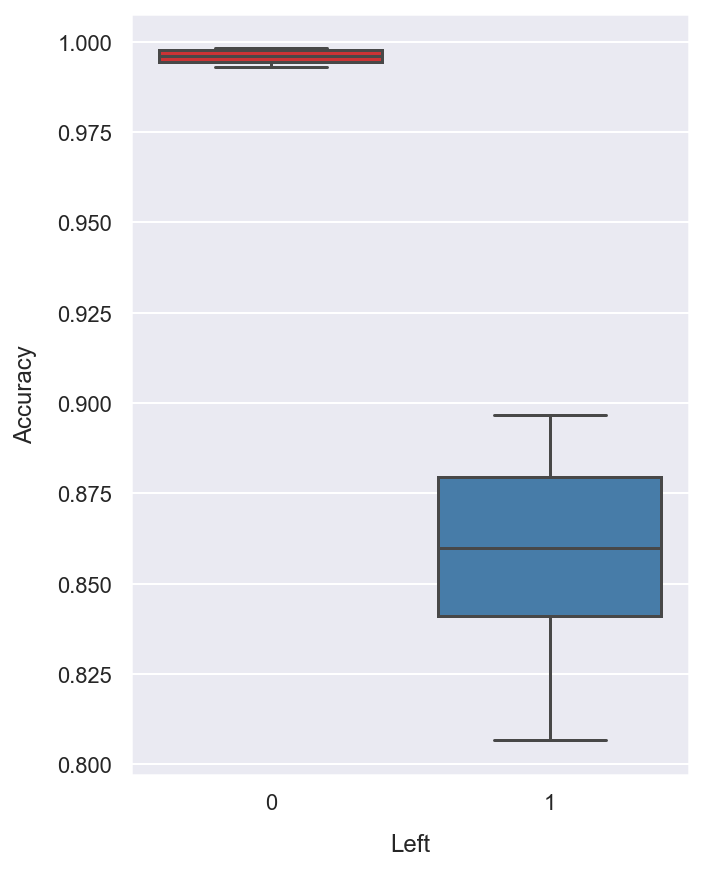

In [106]:
# Box plot of result

fig = plt.figure(figsize=(5, 7))
sns.boxplot(data=pd.DataFrame(scores, columns=[0, 1]),
            palette=sns.color_palette('Set1'))
plt.xlabel('Left')
plt.ylabel('Accuracy')

In [107]:
# Access feature importances

d = (clf.feature_importances_, hr.columns)
list(zip(*d))

[(0.3364670233504188, 'satisfaction_level'),
 (0.10284487347583614, 'last_evaluation'),
 (0.21944114625582076, 'number_project'),
 (0.13151991916726855, 'average_monthly_hours'),
 (0.17927669406113753, 'time_spend_company'),
 (0.012686733322855156, 'work_accident'),
 (0.000681575313654466, 'quit'),
 (0.00015139000896639997, 'promotion_last_5years'),
 (0.0008493915081591086, 'department_IT'),
 (0.0002721257682049342, 'department_RandD'),
 (0.000320355991487137, 'department_accounting'),
 (0.00028154057533251984, 'department_hr'),
 (6.886983008547117e-05, 'department_management'),
 (0.00017371910163740872, 'department_marketing'),
 (0.0003582602507586531, 'department_product_mng'),
 (0.0004045945873369045, 'department_sales'),
 (0.0004131133033132131, 'department_support'),
 (0.005045055204547489, 'department_technical'),
 (0.006390951820509999, 'salary_high'),
 (0.0023526671026695323, 'salary_low')]

## Dimensionality Reduction techniques

Dimensionality reduction can simply involve removing unimportant features from the training data, but more exotic methods exist, such as Principal Component Analysis (PCA). 

This technique transforms the data by projecting it into a new subspace of orthogonal "principal components," where the components with the highest eigenvalues encode the most information for training the model. Then, we can simply select a few of these principal components in place of the original high-dimensional dataset.

Our purpose here is to use PCA to improve our Random Forest.

Text(0.5, 0, 'Feature importance')

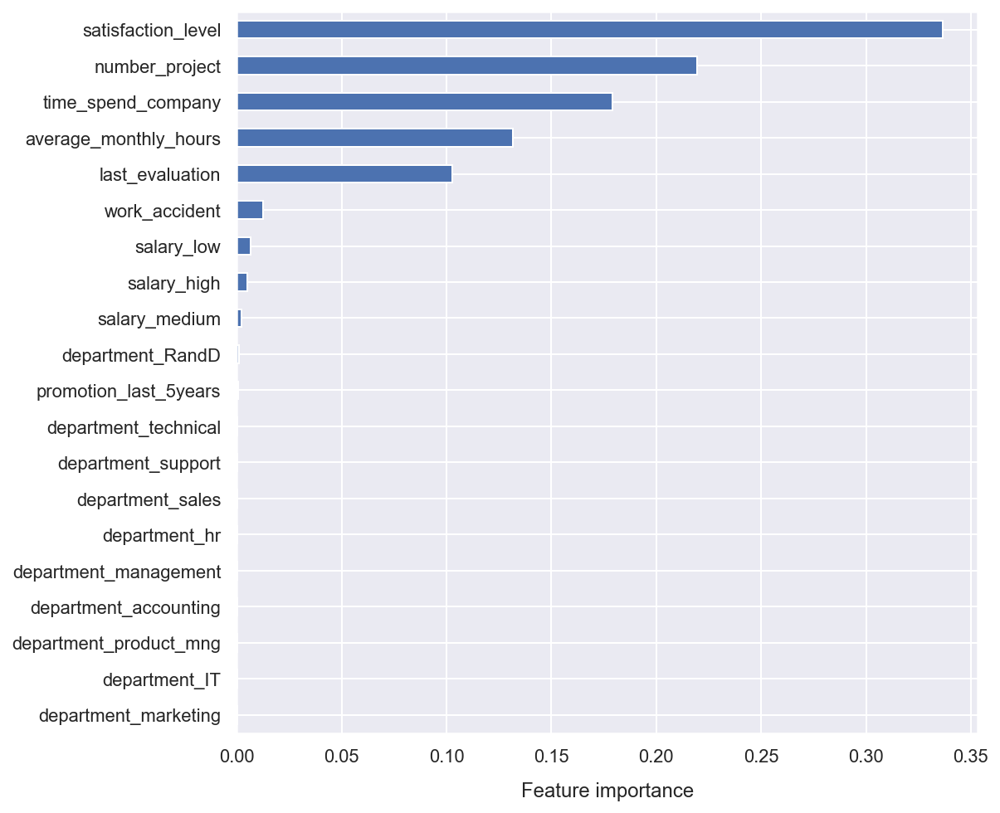

In [108]:
# Visualize the feature importances

pd.Series(clf.feature_importances_, name='Feature importance',
            index=hr[features].columns)\
    .sort_values()\
    .plot.barh()
plt.xlabel('Feature importance')

In [109]:
# Print all the features with low importance

importances = list(pd.Series(clf.feature_importances_, index=hr[features].columns)\
        .sort_values(ascending=False).index)

np.array(importances[5:])

array(['work_accident', 'salary_low', 'salary_high', 'salary_medium',
       'department_RandD', 'promotion_last_5years',
       'department_technical', 'department_support', 'department_sales',
       'department_hr', 'department_management', 'department_accounting',
       'department_product_mng', 'department_IT', 'department_marketing'],
      dtype='<U22')

In [110]:
# Reduce the one-hot-encoded features with PCA

from sklearn.decomposition import PCA

pca_features = ['work_accident', 'salary_low', 'salary_high', 'salary_medium',
       'promotion_last_5years', 'department_RandD', 'department_hr',
       'department_technical', 'department_support',
       'department_management', 'department_sales',
       'department_accounting', 'department_IT', 'department_product_mng',
       'department_marketing']

X_reduce = hr[pca_features]

pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_reduce)

In [111]:
X_pca

array([[-0.67733999,  0.75839278, -0.10494344],
       [ 0.73615606,  0.77158969, -0.11047796],
       [ 0.73615606,  0.77158969, -0.11047796],
       ...,
       [-0.67157626, -0.33372944,  0.70970475],
       [-0.67157626, -0.33372944,  0.70970475],
       [ 0.07052404, -0.18786538,  0.09591488]])

In [112]:
# Add principal components to our `hr` dataframe

hr['first_principle_component'] = X_pca.T[0]
hr['second_principle_component'] = X_pca.T[1]
hr['third_principle_component'] = X_pca.T[2]

In [113]:
# Select reduced-dimension feature set

features = ['satisfaction_level', 'number_project', 'time_spend_company',
            'average_monthly_hours', 'last_evaluation',
            'first_principle_component',
            'second_principle_component',
            'third_principle_component']

X = hr[features].values
y = hr.quit.values

In [114]:
# Show k-fold results for the selected model with reduced dimensionality:
# a random forest with max_depth = 6 or 9, and n_estimators = 200

np.random.seed(42)
clf = RandomForestClassifier(n_estimators=200, max_depth=6)
scores = cross_val_class_score(clf, X, y)

print('accuracy = {} +/- {}'.format(scores.mean(axis=0), scores.std(axis=0)))

fold: 1 accuracy: [0.99824869 0.91340782]
fold: 2 accuracy: [0.99824869 0.87988827]
fold: 3 accuracy: [0.99650044 0.89635854]
fold: 4 accuracy: [0.99300087 0.91316527]
fold: 5 accuracy: [0.99387577 0.88515406]
fold: 6 accuracy: [0.99475066 0.90756303]
fold: 7 accuracy: [0.99650044 0.92717087]
fold: 8 accuracy: [0.99475066 0.89635854]
fold: 9 accuracy: [0.99475066 0.91316527]
fold: 10 accuracy: [0.99387577 0.91036415]
accuracy = [0.99545026 0.90425958] +/- [0.00174052 0.01378134]


Text(0, 0.5, 'Accuracy')

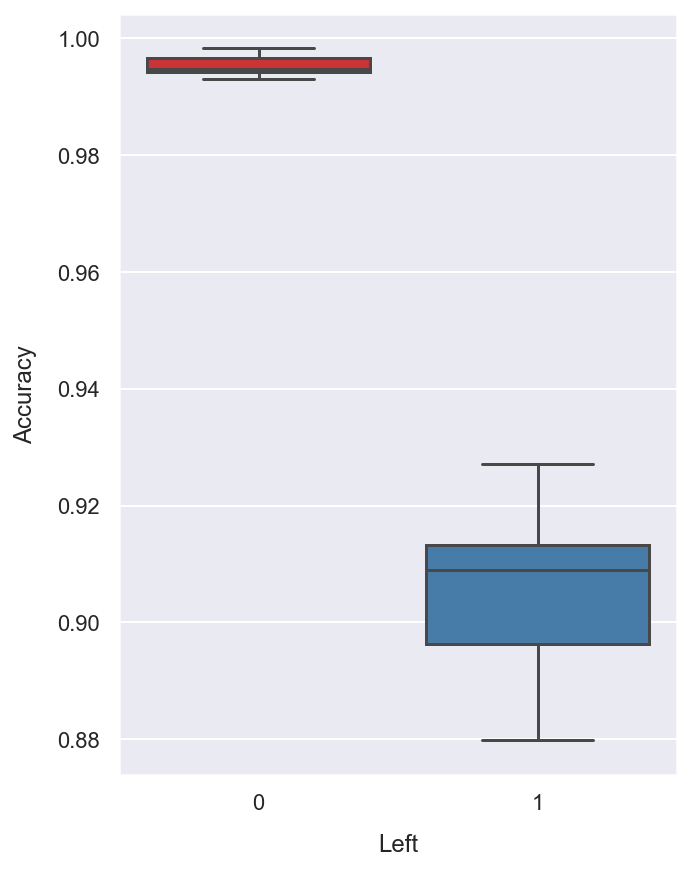

In [115]:
# Box plot of result

fig = plt.figure(figsize=(5, 7))
sns.boxplot(data=pd.DataFrame(scores, columns=[0, 1]),
            palette=sns.color_palette('Set1'))
plt.xlabel('Left')
plt.ylabel('Accuracy')

Comparing this to the previous boxplot before dimensionality reduction, we find an improvement in the class 1 accuracy! Now, the majority of the validation sets return an accuracy greater than 90%. The average accuracy of 90.6% can be compared to the accuracy of 85.6% prior to dimensionality reduction!

---

## Operationalizing this model

Train the final model on all the samples

In [116]:
operational_model = RandomForestClassifier(n_estimators=200, max_depth=6)
operational_model.fit(X, y)

RandomForestClassifier(max_depth=6, n_estimators=200)

In [117]:
operational_model = XGBClassifier(n_estimators=200, max_depth=6)
operational_model.fit(X, y)

[20:04:32] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=200, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

Save this model offline

In [118]:
from sklearn.externals import joblib
joblib.dump(operational_model, 'random-forest-trained.pkl')
# joblib.dump(operational_model, 'xgboost-trained.pkl')

ImportError: cannot import name 'joblib' from 'sklearn.externals' (/Users/mash/.pyenv/versions/3.8.2/envs/basicwork/lib/python3.8/site-packages/sklearn/externals/__init__.py)

Confirm that this *.pkl file has been saved in the working directory

In [ ]:
!ls *.pkl

Re-load the model from the *pkl file

In [ ]:
working_model = joblib.load('random-forest-trained.pkl')
working_model

#### Creating a whole new person with unseen feature values.  

In [ ]:
StephenMiller = pd.Series([0.8,0.85,9,288,6,0,'yes',0,'yes','sales','low', 0.341423, -0.831704, -.787979],
                          ['satisfaction_level','last_evaluation','number_project','average_montly_hours',
                           'time_spend_company','work_accident','left','promotion_last_5years',
                           'is_smoker','department','salary', 'first_principle_component', 
                           'second_principle_component', 'third_principle_component'])

In [ ]:
type(StephenMiller)

In [ ]:
StephenMiller[features]

In [ ]:
featuresStephenMiller = StephenMiller[features]

In [ ]:
working_model.predict_proba([featuresStephenMiller])

In [ ]:
StephenMiller = pd.Series([0.8,0.85,9,288,6,0,'yes',0,'yes','sales','low', 0.341423, -0.831704, -.787979],
                          ['satisfaction_level','last_evaluation','number_project','average_montly_hours',
                           'time_spend_company','work_accident','left','promotion_last_5years',
                           'is_smoker','department','salary', 'first_principle_component', 
                           'second_principle_component', 'third_principle_component'])

In [ ]:
working_model.predict_proba([featuresStephenMiller])

The left 0,1 corresponding value has Stephen leaving with a probability of ~69%. <i>Recall that these [features] are the dimensionality reduced.</i> 

#### What if we let Stephen work fewer hours, take on fewer projects, and give him a better performance score?

In [ ]:
featuresStephenMiller.average_montly_hours = 180
featuresStephenMiller.number_project = 2
featuresStephenMiller.last_evaluation = 0.9
working_model.predict_proba([featuresStephenMiller])

Stephen's attrition probability goes down significantly to 22%, down from 69%! 

---
## Advanced ML using H2O

In [3]:
! pip3 show h2o --verbose

Name: h2o
Version: 3.32.1.1
Summary: H2O, Fast Scalable Machine Learning, for python 
Home-page: https://github.com/h2oai/h2o-3.git
Author: H2O.ai
Author-email: support@h2o.ai
License: Apache v2
Location: /Users/mash/.pyenv/versions/3.8.2/envs/basicwork/lib/python3.8/site-packages
Requires: future, requests, colorama, tabulate
Required-by: 
Metadata-Version: 2.1
Installer: pip
Classifiers:
  Development Status :: 5 - Production/Stable
  Intended Audience :: Education
  Intended Audience :: Developers
  Intended Audience :: Science/Research
  Intended Audience :: Customer Service
  Intended Audience :: Financial and Insurance Industry
  Intended Audience :: Healthcare Industry
  Intended Audience :: Telecommunications Industry
  Topic :: Scientific/Engineering :: Artificial Intelligence
  Topic :: Scientific/Engineering :: Information Analysis
  License :: OSI Approved :: Apache Software License
  Programming Language :: Python :: 2.7
  Programming Language :: Python :: 3.5
  Programmin

In [19]:
import h2o
from h2o.estimators.deeplearning import H2ODeepLearningEstimator
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator

h2o.init(min_mem_size = "15g")

# from h2o.estimators.deepwater import H2ODeepWaterEstimator 
## Cannot build a Deep Water model - no backend found.
#if not H2ODeepWaterEstimator.available(): exit

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.10" 2021-01-19; OpenJDK Runtime Environment (build 11.0.10+9); OpenJDK 64-Bit Server VM (build 11.0.10+9, mixed mode)
  Starting server from /Users/mash/.pyenv/versions/3.8.2/envs/basicwork/lib/python3.8/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/8l/_9ht8yyx0g3_wj9p_mz6f7l80000gn/T/tmpcz9vwbum
  JVM stdout: /var/folders/8l/_9ht8yyx0g3_wj9p_mz6f7l80000gn/T/tmpcz9vwbum/h2o_mash_started_from_python.out
  JVM stderr: /var/folders/8l/_9ht8yyx0g3_wj9p_mz6f7l80000gn/T/tmpcz9vwbum/h2o_mash_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.1.1
H2O_cluster_version_age:,18 days
H2O_cluster_name:,H2O_from_python_mash_0dcij5
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,16 Gb
H2O_cluster_total_cores:,16
H2O_cluster_allowed_cores:,16
H2O_cluster_status:,"accepting new members, healthy"


In [20]:
# hr_hx = h2o.H2OFrame(hr)
hr_data = "hr_data.csv"
hr_hx = h2o.import_file(path = hr_data)

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [21]:
hr_hx.describe()

Rows:15000
Cols:11




,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,quit,promotion_last_5years,is_smoker,department,salary
type,real,real,int,int,int,int,enum,int,enum,enum,enum
mins,0.09,0.36,2.0,96.0,2.0,0.0,,0.0,,,
mean,0.6128526666666666,0.716104,3.8032,200.96022416621105,3.4941746918984444,0.1446,,0.021266666666666666,,,
maxs,1.0,1.0,7.0,310.0,10.0,1.0,,1.0,,,
sigma,0.24863341864013347,0.17116362829130294,1.2326817892815005,50.00109823854684,1.4589328483370914,0.35170880939460947,,0.14427675930114495,,,
zeros,0,0,0,0,0,12831,,14681,,,
missing,0,0,0,368,151,0,0,0,14764,0,0
0,0.38,0.53,2.0,157.0,3.0,0.0,yes,0.0,,sales,low
1,0.8,0.86,5.0,262.0,6.0,0.0,yes,0.0,yes,sales,medium
2,0.11,0.88,7.0,272.0,4.0,0.0,yes,0.0,,sales,medium


In [22]:
for i in ['quit', 'is_smoker', 'department', 'salary']:
    hr_hx[i] = hr_hx[i].asfactor()

In [23]:
# no need to convert select features to Categorical in H2O because it imports correctly
hr_hx.types

{'satisfaction_level': 'real',
 'last_evaluation': 'real',
 'number_project': 'int',
 'average_monthly_hours': 'int',
 'time_spend_company': 'int',
 'work_accident': 'int',
 'quit': 'enum',
 'promotion_last_5years': 'int',
 'is_smoker': 'enum',
 'department': 'enum',
 'salary': 'enum'}

In [24]:
hr_hx.summary()

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,time_spend_company,work_accident,quit,promotion_last_5years,is_smoker,department,salary
type,real,real,int,int,int,int,enum,int,enum,enum,enum
mins,0.09,0.36,2.0,96.0,2.0,0.0,,0.0,,,
mean,0.6128526666666666,0.716104,3.8032,200.96022416621105,3.4941746918984444,0.1446,,0.021266666666666666,,,
maxs,1.0,1.0,7.0,310.0,10.0,1.0,,1.0,,,
sigma,0.24863341864013347,0.17116362829130294,1.2326817892815005,50.00109823854684,1.4589328483370914,0.35170880939460947,,0.14427675930114495,,,
zeros,0,0,0,0,0,12831,,14681,,,
missing,0,0,0,368,151,0,0,0,14764,0,0
0,0.38,0.53,2.0,157.0,3.0,0.0,yes,0.0,,sales,low
1,0.8,0.86,5.0,262.0,6.0,0.0,yes,0.0,yes,sales,medium
2,0.11,0.88,7.0,272.0,4.0,0.0,yes,0.0,,sales,medium


In [25]:
predictors = list(set(hr_hx.names))
predictors.remove('is_smoker')

predictors.remove('quit')
response = "quit"

predictors

['promotion_last_5years',
 'department',
 'time_spend_company',
 'last_evaluation',
 'number_project',
 'average_monthly_hours',
 'satisfaction_level',
 'work_accident',
 'salary']

In [26]:
r = hr_hx.runif(seed = 42)
train = hr_hx[r  < 0.8]                 ## 80% for training
valid = hr_hx[(r >= 0.8) & (r < 0.9)]   ## 10% for early stopping (only enabled by default for Deep Water)
test  = hr_hx[r  >= 0.9]                ## 10% for final testing
print(train.dim)
print(valid.dim)
print(test.dim)

[12042, 11]
[1457, 11]
[1501, 11]


In [27]:
from h2o.automl import H2OAutoML

In [28]:
aml = H2OAutoML(max_models = 18, seed = 42, max_runtime_secs = 400)
aml.train(x = predictors, y = response, training_frame = train, validation_frame = valid)

aml.leaderboard

AutoML progress: |
18:10:20.310: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

████████████████████████████████████████████████████████| 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_BestOfFamily_AutoML_20210413_181020,0.993389,0.0528628,0.988503,0.0205789,0.10598,0.0112317
StackedEnsemble_AllModels_AutoML_20210413_181020,0.993157,0.0520294,0.98857,0.0208296,0.104479,0.0109159
GBM_1_AutoML_20210413_181020,0.992943,0.0560194,0.988357,0.0225409,0.110499,0.0122101
GBM_3_AutoML_20210413_181020,0.992873,0.0548235,0.988325,0.0217452,0.106829,0.0114125
GBM_grid__1_AutoML_20210413_181020_model_2,0.992694,0.0564914,0.988271,0.0215599,0.10658,0.0113593
GBM_2_AutoML_20210413_181020,0.992572,0.0559973,0.987936,0.0217888,0.108789,0.0118351
GBM_4_AutoML_20210413_181020,0.99256,0.0557881,0.987989,0.0214073,0.106738,0.0113931
XGBoost_grid__1_AutoML_20210413_181020_model_2,0.992313,0.0560838,0.987067,0.0197832,0.105667,0.0111655
GBM_5_AutoML_20210413_181020,0.991874,0.0626407,0.986574,0.0236744,0.115613,0.0133663
XRT_1_AutoML_20210413_181020,0.991139,0.0978601,0.985119,0.0296258,0.14598,0.0213102


In [29]:
aml.leader

Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_AutoML_20210413_181020

No model summary for this model

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.0015044252381098816
RMSE: 0.03878692096712346
LogLoss: 0.012097412400656128
Null degrees of freedom: 10047
Residual degrees of freedom: 10044
Null deviance: 11026.966946024631
Residual deviance: 243.10959960358554
AIC: 251.10959960358554
AUC: 0.9999827123687184
AUCPR: 0.9999427600205837
Gini: 0.9999654247374368

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4906343685942352: 


,,no,yes,Error,Rate
0,no,7651.0,6.0,0.0008,(6.0/7657.0)
1,yes,3.0,2388.0,0.0013,(3.0/2391.0)
2,Total,7654.0,2394.0,0.0009,(9.0/10048.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.490634,0.998119,176.0
1,max f2,0.288077,0.998747,187.0
2,max f0point5,0.673746,0.998237,162.0
3,max accuracy,0.518454,0.999104,174.0
4,max precision,0.999947,1.000000,0.0
5,max recall,0.288077,1.000000,187.0
6,max specificity,0.999947,1.000000,0.0
7,max absolute_mcc,0.490634,0.997532,176.0
8,max min_per_class_accuracy,0.490634,0.998745,176.0
9,max mean_per_class_accuracy,0.288077,0.999021,187.0



Gains/Lift Table: Avg response rate: 23.80 %, avg score: 24.00 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010052,0.999974,4.202426,4.202426,1.000000,0.999979,1.000000,0.999979,0.042242,0.042242,320.242576,320.242576,0.042242
1,2,0.020104,0.999963,4.202426,4.202426,1.000000,0.999969,1.000000,0.999974,0.042242,0.084483,320.242576,320.242576,0.084483
2,3,0.030056,0.999946,4.202426,4.202426,1.000000,0.999954,1.000000,0.999967,0.041824,0.126307,320.242576,320.242576,0.126307
3,4,0.040008,0.999927,4.202426,4.202426,1.000000,0.999937,1.000000,0.999960,0.041824,0.168130,320.242576,320.242576,0.168130
4,5,0.050159,0.999848,4.202426,4.202426,1.000000,0.999909,1.000000,0.999950,0.042660,0.210790,320.242576,320.242576,0.210790
5,6,0.100020,0.997354,4.202426,4.202426,1.000000,0.998074,1.000000,0.999015,0.209536,0.420326,320.242576,320.242576,0.420326
6,7,0.150080,0.994845,4.202426,4.202426,1.000000,0.996308,1.000000,0.998112,0.210372,0.630698,320.242576,320.242576,0.630698
7,8,0.200040,0.985072,4.202426,4.202426,1.000000,0.991600,1.000000,0.996486,0.209954,0.840652,320.242576,320.242576,0.840652
8,9,0.300060,0.022620,1.593158,3.332670,0.379104,0.382688,0.793035,0.791886,0.159348,1.000000,59.315842,233.266998,0.918506
9,10,0.399980,0.007438,0.000000,2.500124,0.000000,0.012655,0.594924,0.597224,0.000000,1.000000,-100.000000,150.012441,0.787384




ModelMetricsBinomialGLM: stackedensemble
** Reported on validation data. **

MSE: 0.009220175607693218
RMSE: 0.09602174549388913
LogLoss: 0.04096330717455365
Null degrees of freedom: 1456
Residual degrees of freedom: 1453
Null deviance: 1608.9472521677867
Residual deviance: 119.36707710664932
AIC: 127.36707710664932
AUC: 0.9968431708938039
AUCPR: 0.9931464997654191
Gini: 0.9936863417876078

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.7095423383601787: 


,,no,yes,Error,Rate
0,no,1105.0,1.0,0.0009,(1.0/1106.0)
1,yes,11.0,340.0,0.0313,(11.0/351.0)
2,Total,1116.0,341.0,0.0082,(12.0/1457.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.709542,0.982659,110.0
1,max f2,0.597609,0.975400,113.0
2,max f0point5,0.783362,0.992970,108.0
3,max accuracy,0.783362,0.991764,108.0
4,max precision,0.999966,1.000000,0.0
5,max recall,0.005710,1.000000,316.0
6,max specificity,0.999966,1.000000,0.0
7,max absolute_mcc,0.783362,0.977469,108.0
8,max min_per_class_accuracy,0.195417,0.974359,128.0
9,max mean_per_class_accuracy,0.597609,0.984399,113.0



Gains/Lift Table: Avg response rate: 24.09 %, avg score: 24.29 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010295,0.999975,4.150997,4.150997,1.000000,0.999979,1.000000,0.999979,0.042735,0.042735,315.099715,315.099715,0.042735
1,2,0.020590,0.999964,4.150997,4.150997,1.000000,0.999970,1.000000,0.999974,0.042735,0.085470,315.099715,315.099715,0.085470
2,3,0.030199,0.999949,4.150997,4.150997,1.000000,0.999954,1.000000,0.999968,0.039886,0.125356,315.099715,315.099715,0.125356
3,4,0.040494,0.999933,4.150997,4.150997,1.000000,0.999940,1.000000,0.999961,0.042735,0.168091,315.099715,315.099715,0.168091
4,5,0.050103,0.999912,4.150997,4.150997,1.000000,0.999924,1.000000,0.999954,0.039886,0.207977,315.099715,315.099715,0.207977
5,6,0.100206,0.997545,4.150997,4.150997,1.000000,0.998358,1.000000,0.999156,0.207977,0.415954,315.099715,315.099715,0.415954
6,7,0.150309,0.995262,4.150997,4.150997,1.000000,0.996660,1.000000,0.998324,0.207977,0.623932,315.099715,315.099715,0.623932
7,8,0.200412,0.987601,4.150997,4.150997,1.000000,0.992514,1.000000,0.996871,0.207977,0.831909,315.099715,315.099715,0.831909
8,9,0.299931,0.034882,1.517261,3.277103,0.365517,0.399525,0.789474,0.798667,0.150997,0.982906,51.726103,227.710301,0.899723
9,10,0.400137,0.009284,0.142157,2.492022,0.034247,0.018550,0.600343,0.603303,0.014245,0.997151,-85.784256,149.202230,0.786482




ModelMetricsBinomialGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.011231723639593317
RMSE: 0.10597982656899056
LogLoss: 0.052862826801690466
Null degrees of freedom: 12041
Residual degrees of freedom: 12038
Null deviance: 13219.806366106093
Residual deviance: 1273.1483206919129
AIC: 1281.1483206919129
AUC: 0.9933888683496978
AUCPR: 0.9885026950009962
Gini: 0.9867777366993955

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5331797681515577: 


,,no,yes,Error,Rate
0,no,9143.0,32.0,0.0035,(32.0/9175.0)
1,yes,108.0,2759.0,0.0377,(108.0/2867.0)
2,Total,9251.0,2791.0,0.0116,(140.0/12042.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.533180,0.975256,153.0
1,max f2,0.452567,0.968341,165.0
2,max f0point5,0.671454,0.984289,136.0
3,max accuracy,0.599965,0.988374,146.0
4,max precision,0.999942,1.000000,0.0
5,max recall,0.000904,1.000000,394.0
6,max specificity,0.999942,1.000000,0.0
7,max absolute_mcc,0.599965,0.967811,146.0
8,max min_per_class_accuracy,0.125805,0.973143,245.0
9,max mean_per_class_accuracy,0.452567,0.979814,165.0



Gains/Lift Table: Avg response rate: 23.81 %, avg score: 23.81 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010048,0.999965,4.200209,4.200209,1.000000,0.999976,1.000000,0.999976,0.042204,0.042204,320.020928,320.020928,0.042204
1,2,0.020013,0.999938,4.200209,4.200209,1.000000,0.999953,1.000000,0.999965,0.041856,0.084060,320.020928,320.020928,0.084060
2,3,0.030061,0.999721,4.200209,4.200209,1.000000,0.999901,1.000000,0.999943,0.042204,0.126264,320.020928,320.020928,0.126264
3,4,0.040027,0.999054,4.200209,4.200209,1.000000,0.999320,1.000000,0.999788,0.041856,0.168120,320.020928,320.020928,0.168120
4,5,0.050075,0.998633,4.200209,4.200209,1.000000,0.998839,1.000000,0.999598,0.042204,0.210324,320.020928,320.020928,0.210324
5,6,0.100066,0.997100,4.193232,4.196724,0.998339,0.997863,0.999170,0.998731,0.209627,0.419951,319.323219,319.672363,0.419842
6,7,0.150058,0.994422,4.193232,4.195560,0.998339,0.995998,0.998893,0.997821,0.209627,0.629578,319.323219,319.556046,0.629360
7,8,0.200050,0.981935,4.165324,4.188004,0.991694,0.990500,0.997094,0.995991,0.208232,0.837810,316.532382,318.800444,0.837047
8,9,0.300033,0.032277,1.433792,3.270188,0.341362,0.355535,0.778577,0.782565,0.143355,0.981165,43.379237,227.018785,0.893972
9,10,0.400017,0.010168,0.076748,2.471994,0.018272,0.018014,0.588541,0.591467,0.007674,0.988839,-92.325199,147.199363,0.772817


In [30]:
# Evaluate performance on a test set
perf = aml.leader.model_performance(test)
perf


ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.012122148049791115
RMSE: 0.11010062692733005
LogLoss: 0.05595980996234522
Null degrees of freedom: 1500
Residual degrees of freedom: 1497
Null deviance: 1639.855346178966
Residual deviance: 167.99134950696035
AIC: 175.99134950696035
AUC: 0.9941470995325561
AUCPR: 0.9857992047610592
Gini: 0.9882941990651122

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5540343500143879: 


,,no,yes,Error,Rate
0,no,1141.0,6.0,0.0052,(6.0/1147.0)
1,yes,12.0,342.0,0.0339,(12.0/354.0)
2,Total,1153.0,348.0,0.012,(18.0/1501.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.554034,0.974359,127.0
1,max f2,0.452641,0.970023,131.0
2,max f0point5,0.768355,0.984321,122.0
3,max accuracy,0.768355,0.988008,122.0
4,max precision,0.999976,1.000000,0.0
5,max recall,0.004807,1.000000,324.0
6,max specificity,0.999976,1.000000,0.0
7,max absolute_mcc,0.554034,0.966594,127.0
8,max min_per_class_accuracy,0.099860,0.971751,155.0
9,max mean_per_class_accuracy,0.452641,0.980540,131.0



Gains/Lift Table: Avg response rate: 23.58 %, avg score: 23.72 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010660,0.999973,4.240113,4.240113,1.000000,0.999978,1.000000,0.999978,0.045198,0.045198,324.011299,324.011299,0.045198
1,2,0.020653,0.999958,4.240113,4.240113,1.000000,0.999966,1.000000,0.999972,0.042373,0.087571,324.011299,324.011299,0.087571
2,3,0.030646,0.999944,4.240113,4.240113,1.000000,0.999950,1.000000,0.999965,0.042373,0.129944,324.011299,324.011299,0.129944
3,4,0.041306,0.999925,4.240113,4.240113,1.000000,0.999934,1.000000,0.999957,0.045198,0.175141,324.011299,324.011299,0.175141
4,5,0.051299,0.999908,4.240113,4.240113,1.000000,0.999914,1.000000,0.999949,0.042373,0.217514,324.011299,324.011299,0.217514
5,6,0.100600,0.997422,4.182814,4.212033,0.986486,0.998232,0.993377,0.999107,0.206215,0.423729,318.281417,321.203278,0.422857
6,7,0.150566,0.995131,4.240113,4.221351,1.000000,0.996298,0.995575,0.998175,0.211864,0.635593,324.011299,322.135143,0.634721
7,8,0.200533,0.976933,4.240113,4.226026,1.000000,0.990271,0.996678,0.996206,0.211864,0.847458,324.011299,322.602624,0.846586
8,9,0.300466,0.027612,1.328569,3.262349,0.313333,0.346868,0.769401,0.780240,0.132768,0.980226,32.856874,226.234858,0.889555
9,10,0.400400,0.008454,0.113070,2.476339,0.026667,0.015193,0.584027,0.589296,0.011299,0.991525,-88.693032,147.633887,0.773566


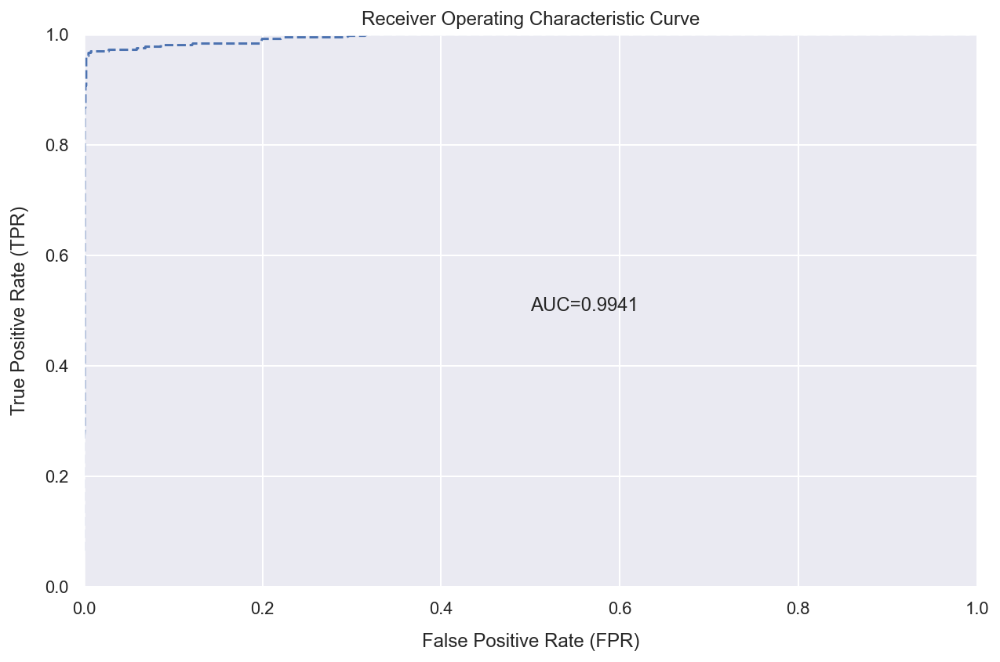

In [31]:
perf.plot()

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_AutoML_20210413_181020,0.993389,0.0528628,0.988503,0.0205789,0.10598,0.0112317,2014,0.008965,StackedEnsemble
StackedEnsemble_AllModels_AutoML_20210413_181020,0.993157,0.0520294,0.98857,0.0208296,0.104479,0.0109159,3385,0.024072,StackedEnsemble
GBM_1_AutoML_20210413_181020,0.992943,0.0560194,0.988357,0.0225409,0.110499,0.0122101,942,0.00483,GBM
GBM_3_AutoML_20210413_181020,0.992873,0.0548235,0.988325,0.0217452,0.106829,0.0114125,792,0.004737,GBM
GBM_grid__1_AutoML_20210413_181020_model_2,0.992694,0.0564914,0.988271,0.0215599,0.10658,0.0113593,826,0.005066,GBM
GBM_2_AutoML_20210413_181020,0.992572,0.0559973,0.987936,0.0217888,0.108789,0.0118351,1008,0.004943,GBM
GBM_4_AutoML_20210413_181020,0.99256,0.0557881,0.987989,0.0214073,0.106738,0.0113931,733,0.004246,GBM
XGBoost_grid__1_AutoML_20210413_181020_model_2,0.992313,0.0560838,0.987067,0.0197832,0.105667,0.0111655,1500,0.001749,XGBoost
GBM_5_AutoML_20210413_181020,0.991874,0.0626407,0.986574,0.0236744,0.115613,0.0133663,1251,0.006343,GBM
XRT_1_AutoML_20210413_181020,0.991139,0.0978601,0.985119,0.0296258,0.14598,0.0213102,400,0.002753,DRF


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_AutoML_20210413_181020


Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4906343685942352: 


,,no,yes,Error,Rate
0,no,7651.0,6.0,0.0008,(6.0/7657.0)
1,yes,3.0,2388.0,0.0013,(3.0/2391.0)
2,Total,7654.0,2394.0,0.0009,(9.0/10048.0)


# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

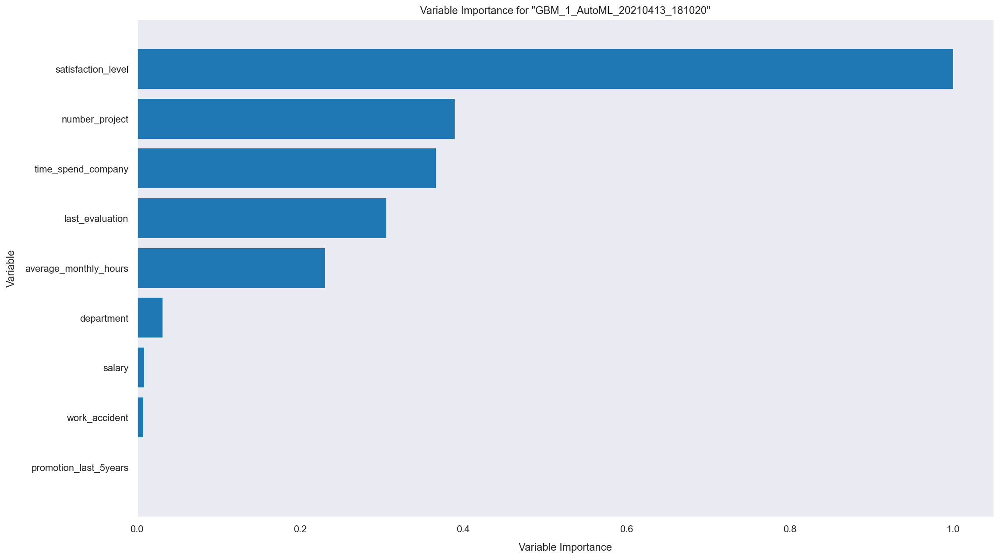

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

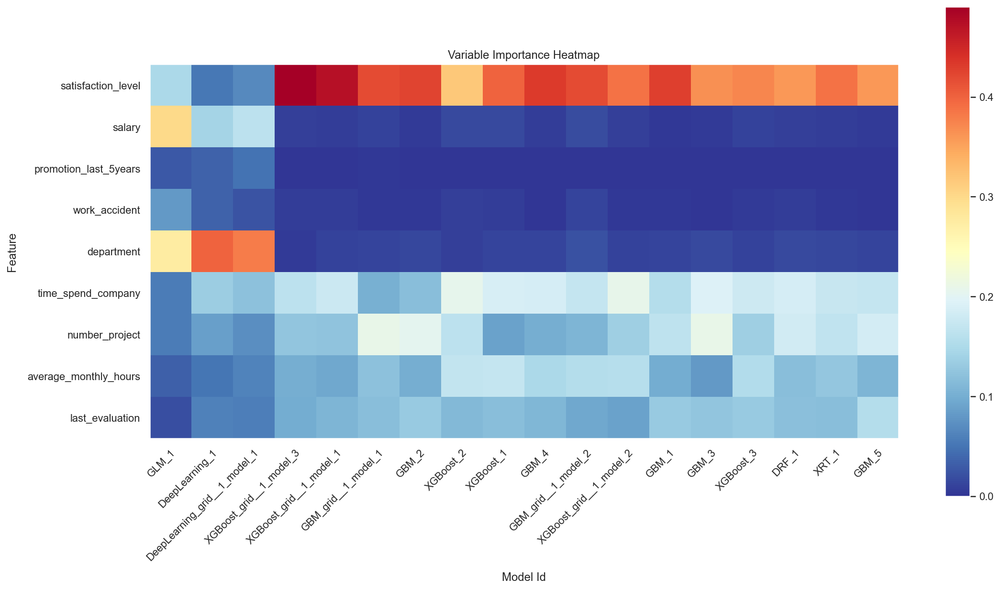

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

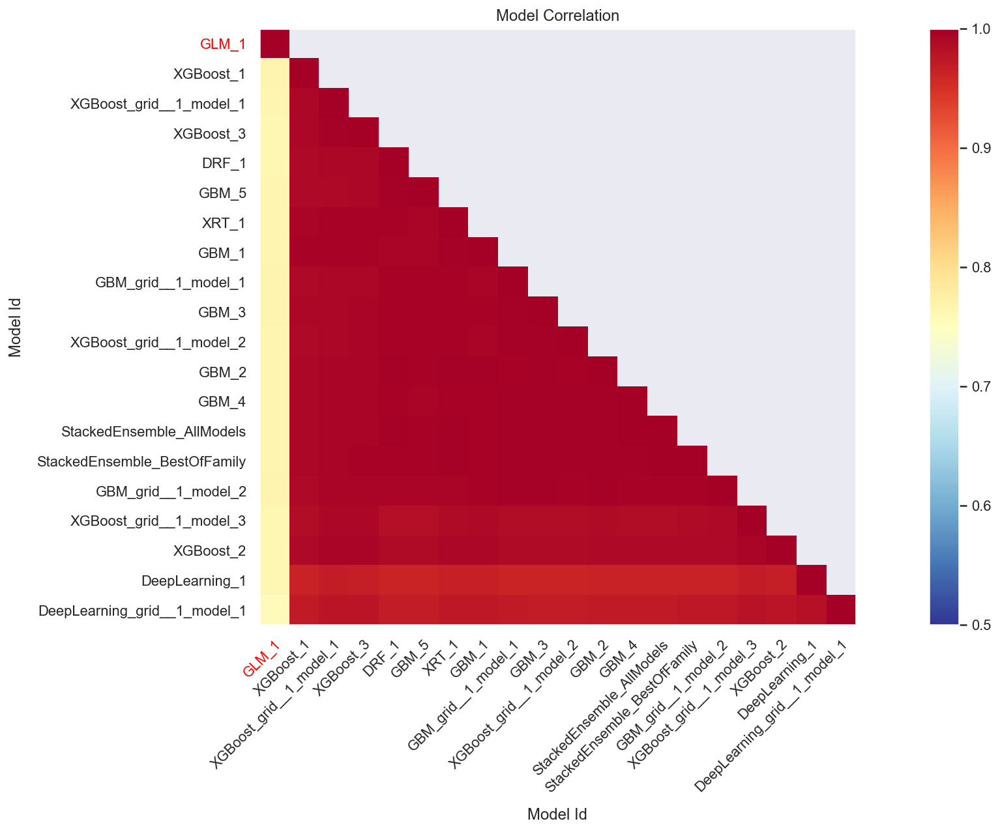

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

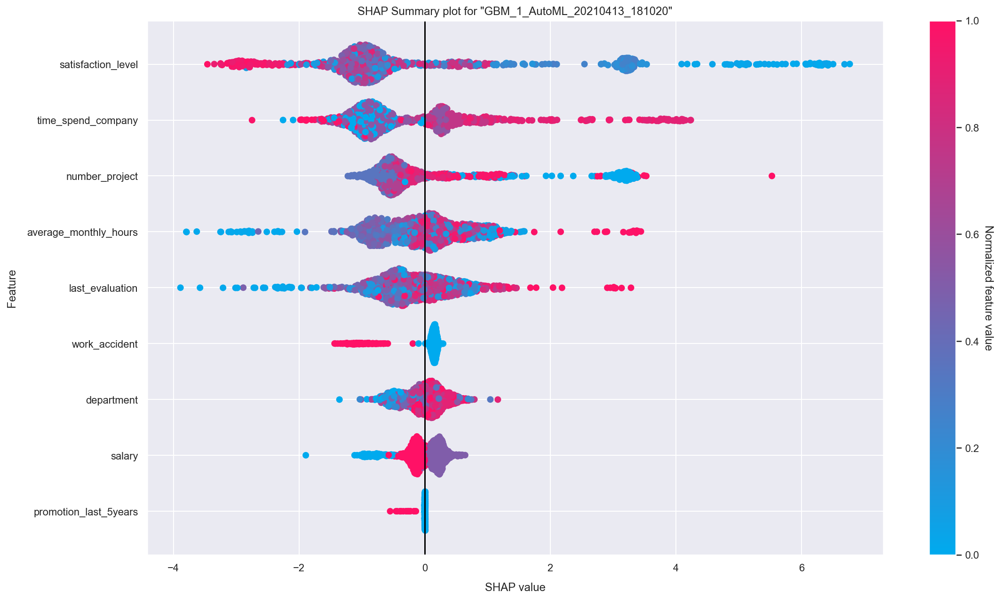

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

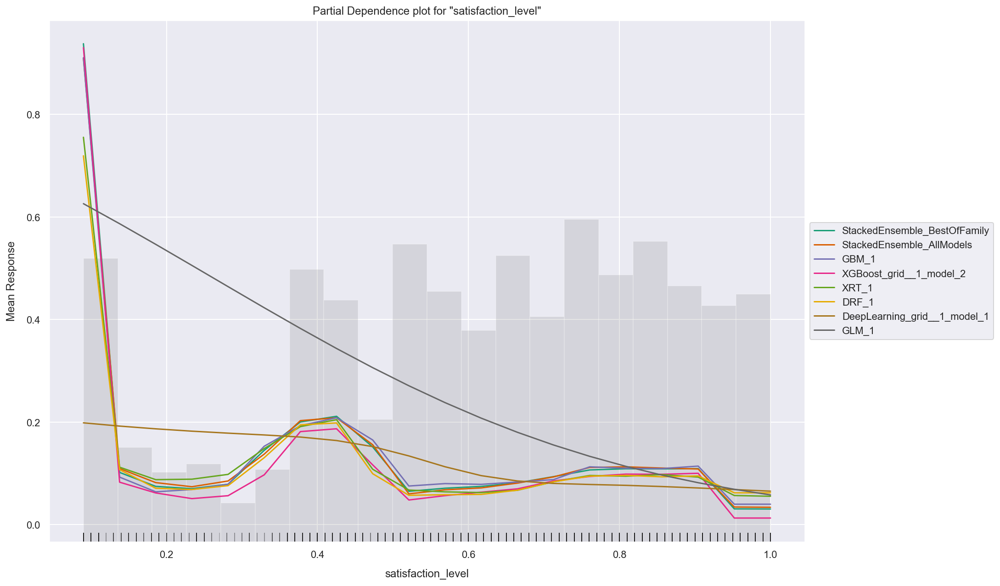

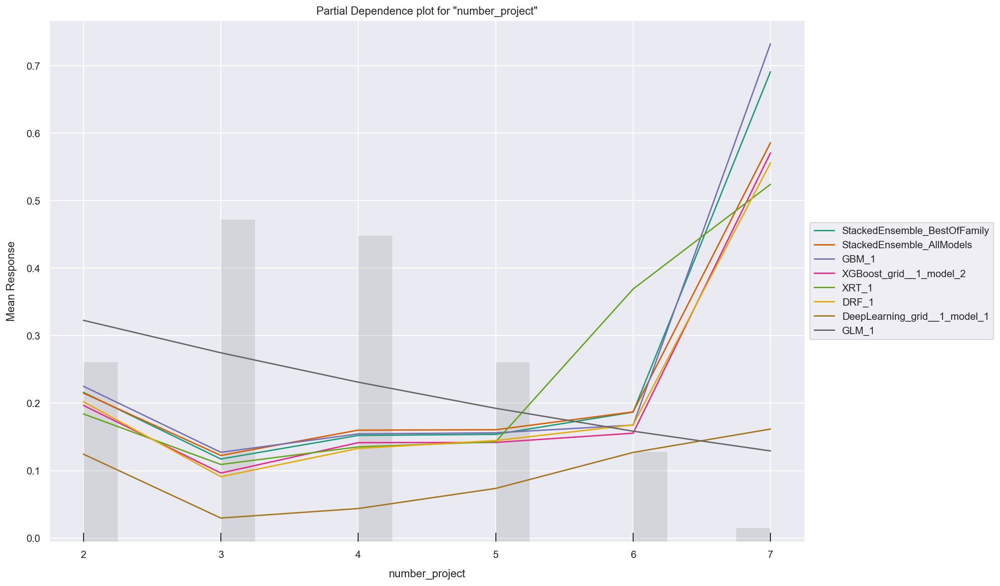

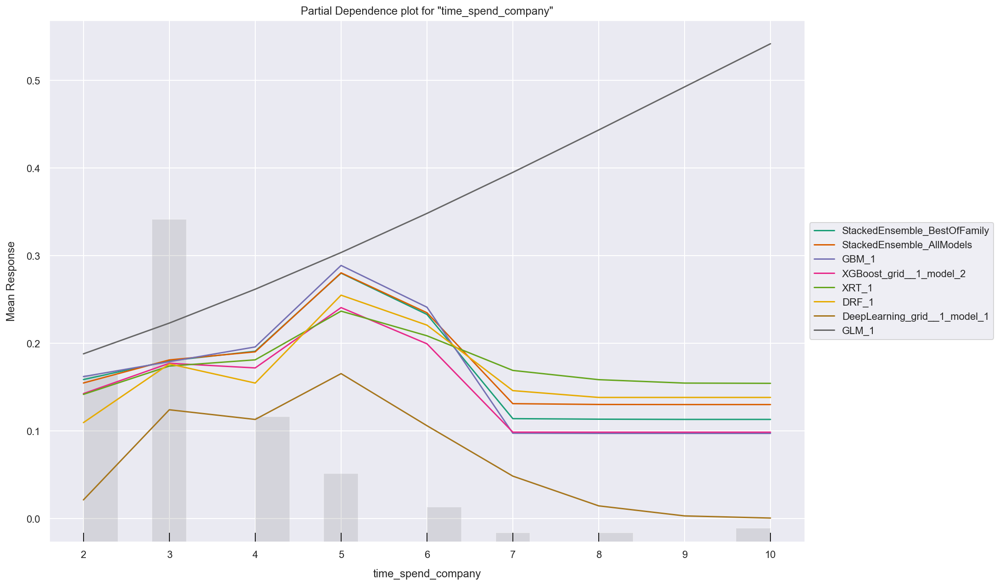

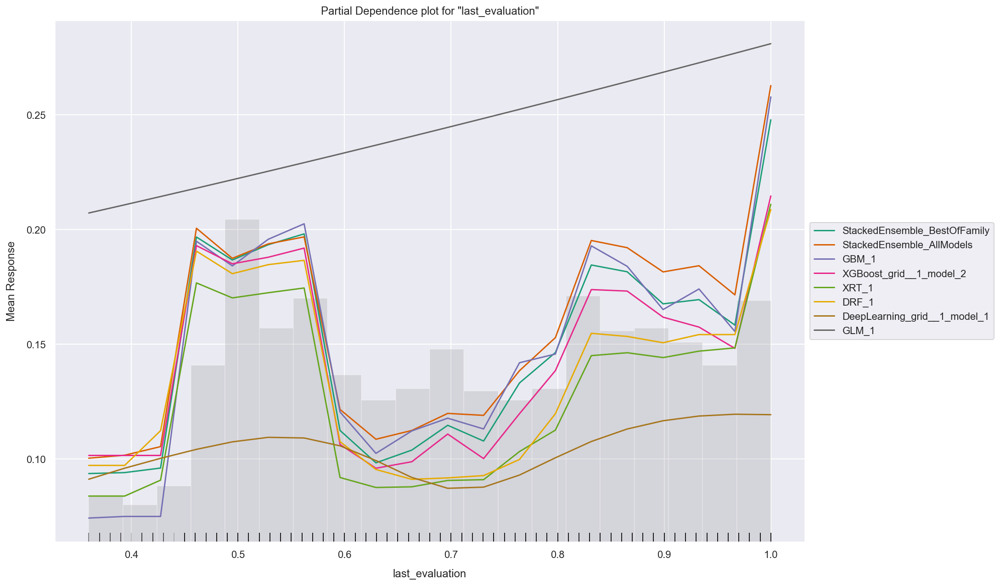

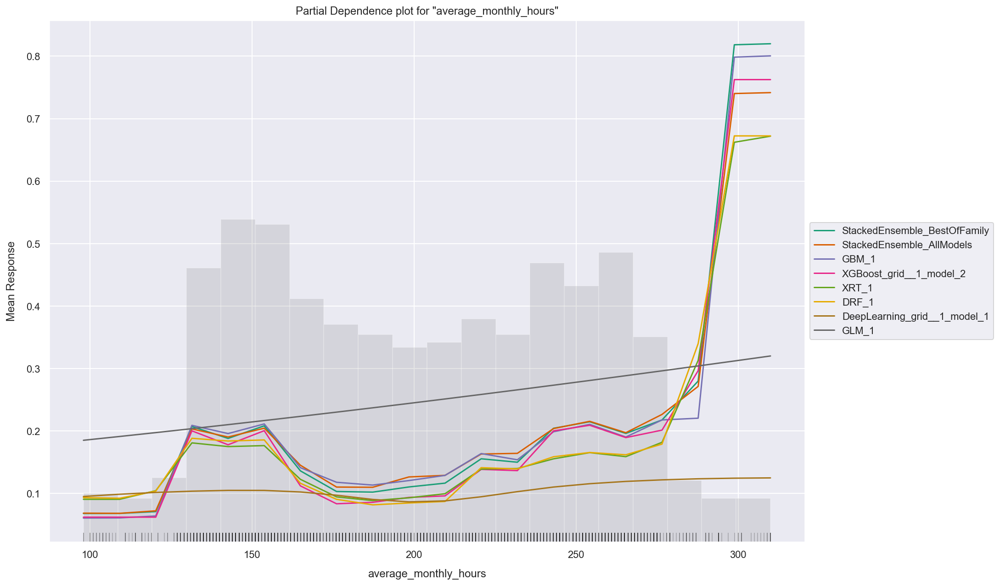

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_AutoML_20210413_181020,0.993389,0.0528628,0.988503,0.0205789,0.10598,0.0112317,2014,0.008965,StackedEnsemble
StackedEnsemble_AllModels_AutoML_20210413_181020,0.993157,0.0520294,0.98857,0.0208296,0.104479,0.0109159,3385,0.024072,StackedEnsemble
GBM_1_AutoML_20210413_181020,0.992943,0.0560194,0.988357,0.0225409,0.110499,0.0122101,942,0.00483,GBM
GBM_3_AutoML_20210413_181020,0.992873,0.0548235,0.988325,0.0217452,0.106829,0.0114125,792,0.004737,GBM
GBM_grid__1_AutoML_20210413_181020_model_2,0.992694,0.0564914,0.988271,0.0215599,0.10658,0.0113593,826,0.005066,GBM
GBM_2_AutoML_20210413_181020,0.992572,0.0559973,0.987936,0.0217888,0.108789,0.0118351,1008,0.004943,GBM
GBM_4_AutoML_20210413_181020,0.99256,0.0557881,0.987989,0.0214073,0.106738,0.0113931,733,0.004246,GBM
XGBoost_grid__1_AutoML_20210413_181020_model_2,0.992313,0.0560838,0.987067,0.0197832,0.105667,0.0111655,1500,0.001749,XGBoost
GBM_5_AutoML_20210413_181020,0.991874,0.0626407,0.986574,0.0236744,0.115613,0.0133663,1251,0.006343,GBM
XRT_1_AutoML_20210413_181020,0.991139,0.0978601,0.985119,0.0296258,0.14598,0.0213102,400,0.002753,DRF


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_AutoML_20210413_181020


Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4906343685942352: 


,,no,yes,Error,Rate
0,no,7651.0,6.0,0.0008,(6.0/7657.0)
1,yes,3.0,2388.0,0.0013,(3.0/2391.0)
2,Total,7654.0,2394.0,0.0009,(9.0/10048.0)


# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

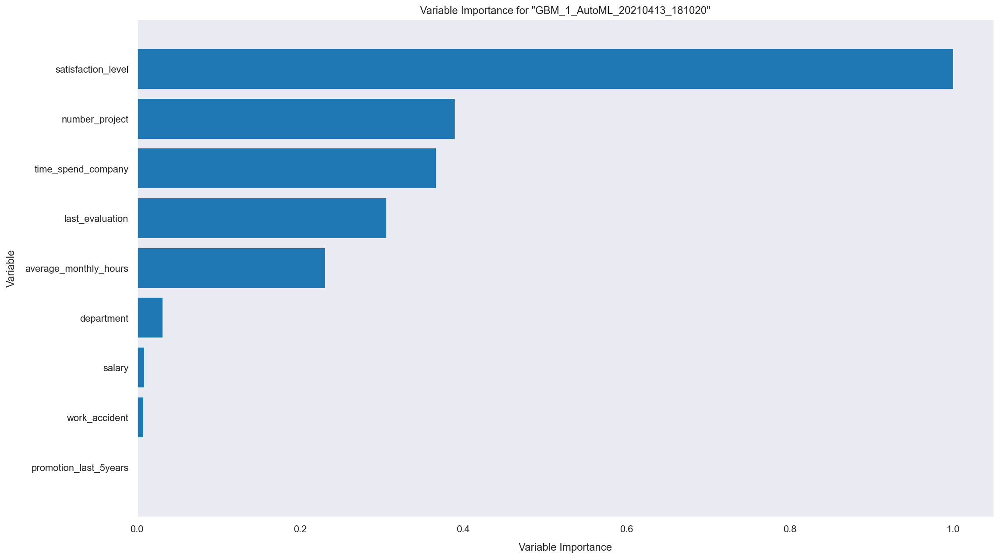

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

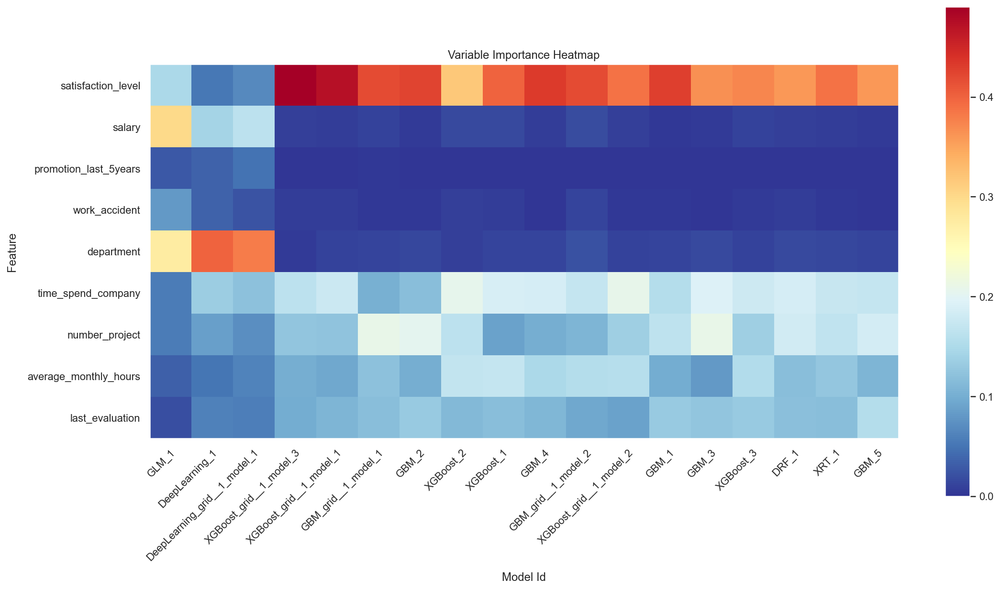

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

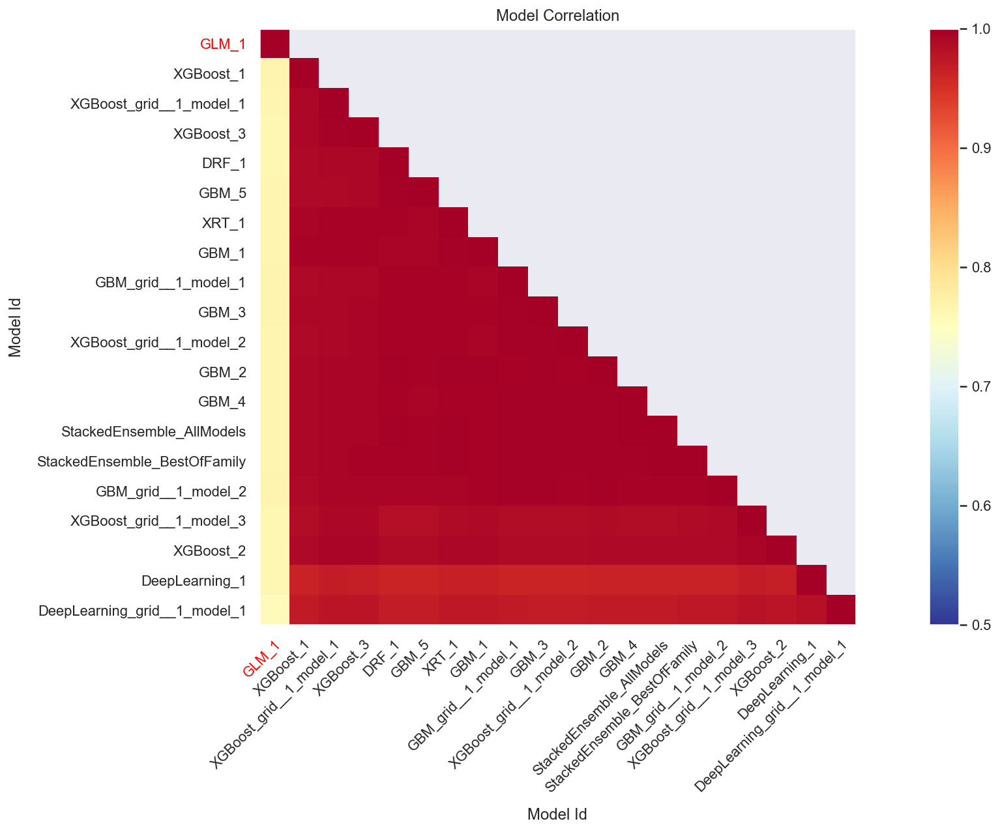

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

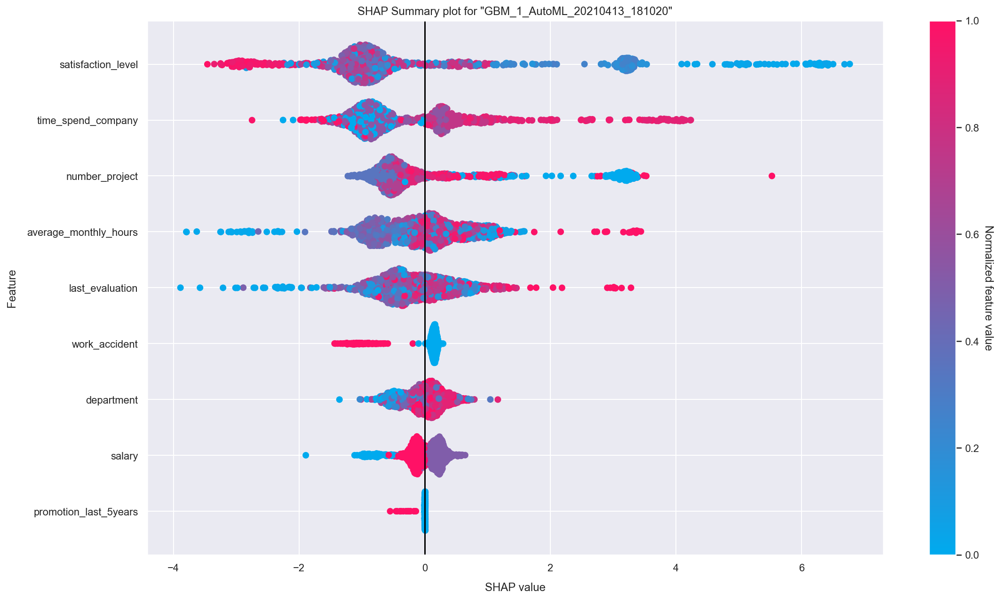

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

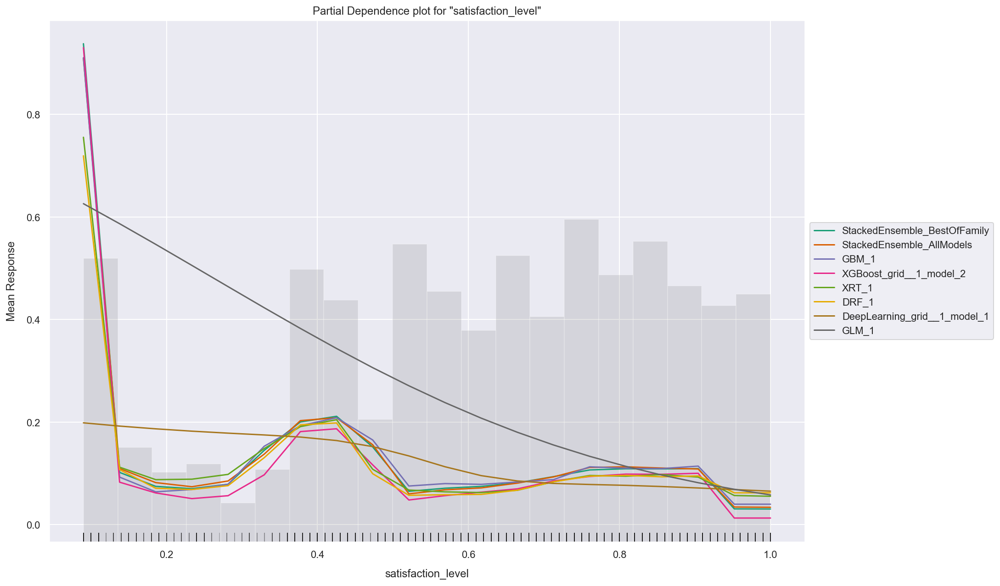

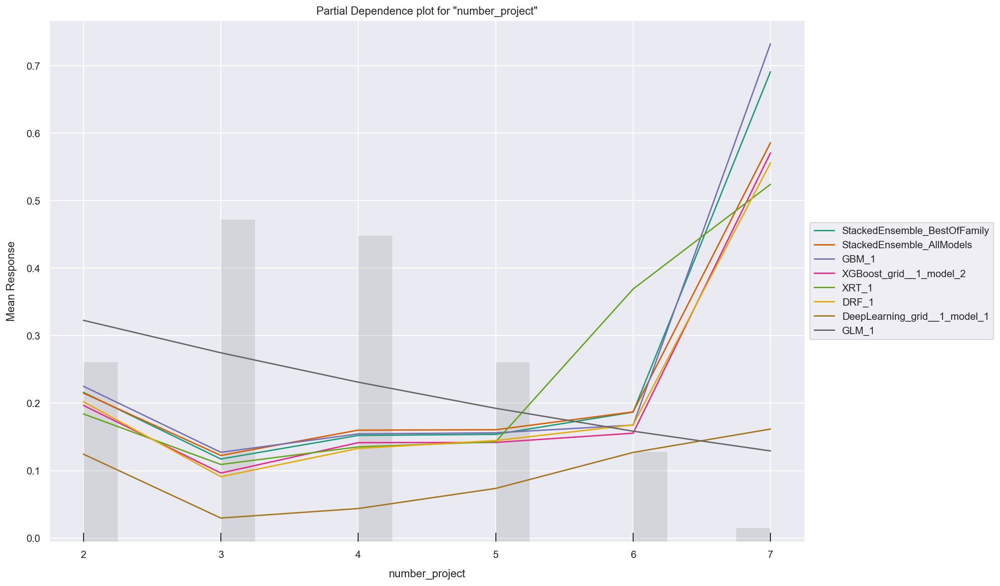

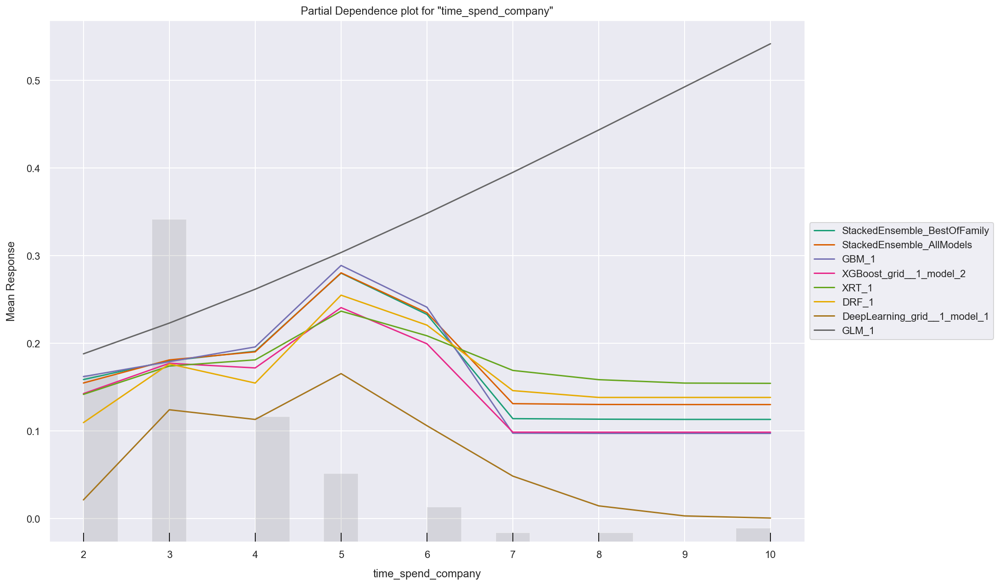

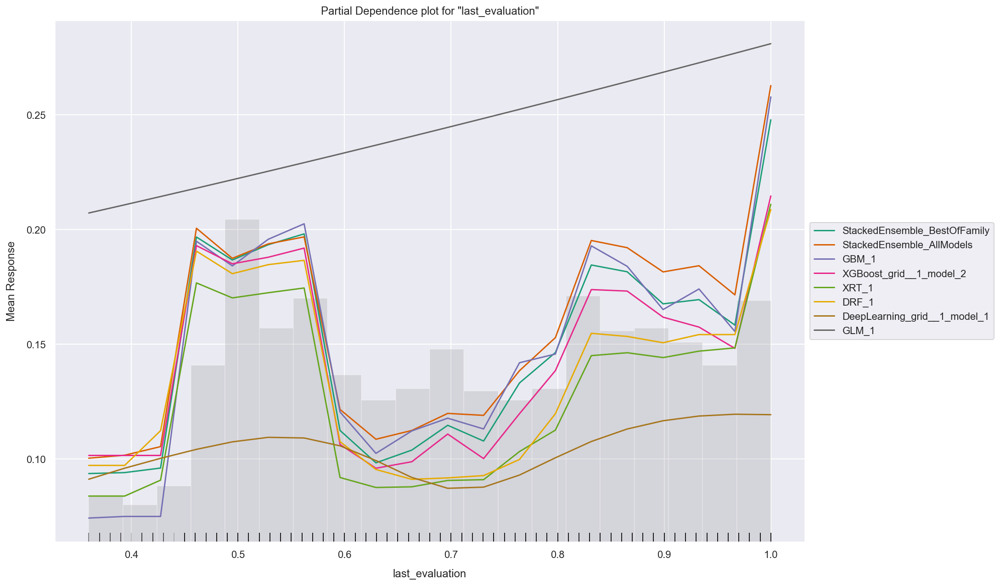

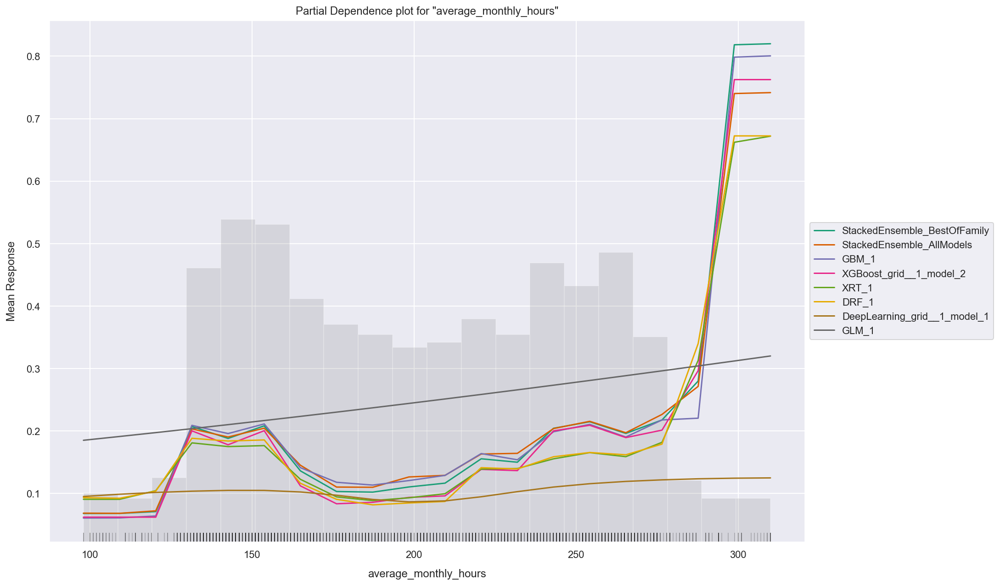

In [33]:
aml.explain(test)

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_AutoML_20210413_181020


Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4906343685942352: 


,,no,yes,Error,Rate
0,no,7651.0,6.0,0.0008,(6.0/7657.0)
1,yes,3.0,2388.0,0.0013,(3.0/2391.0)
2,Total,7654.0,2394.0,0.0009,(9.0/10048.0)


# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

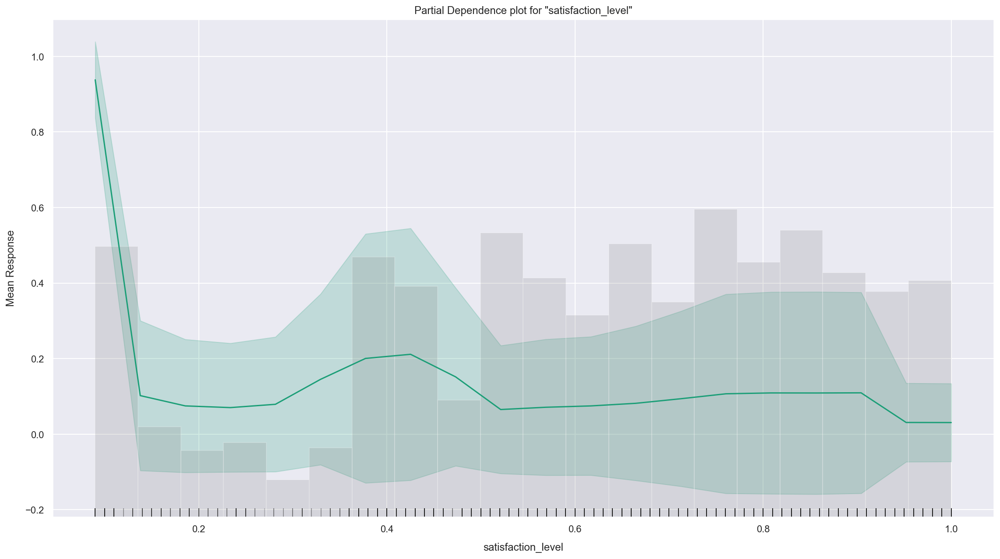

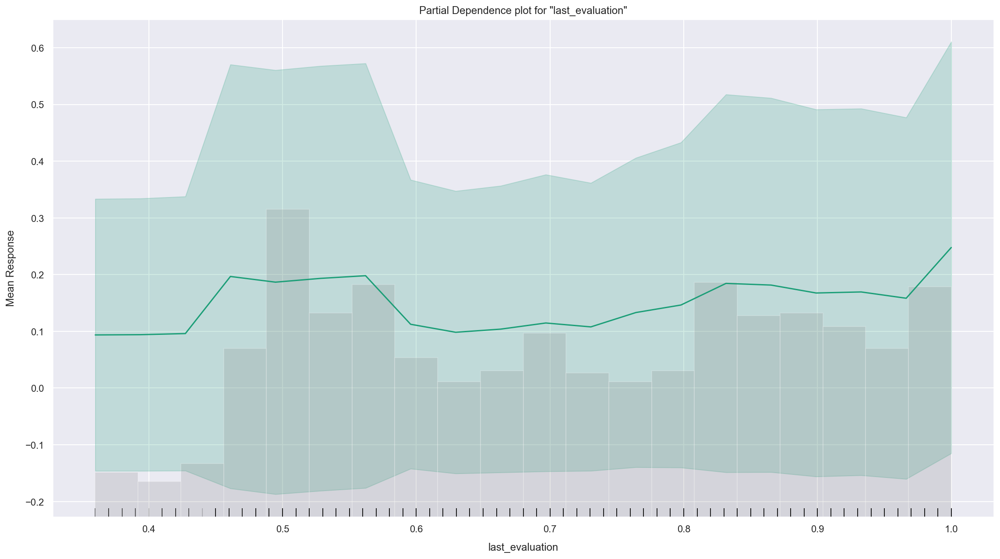

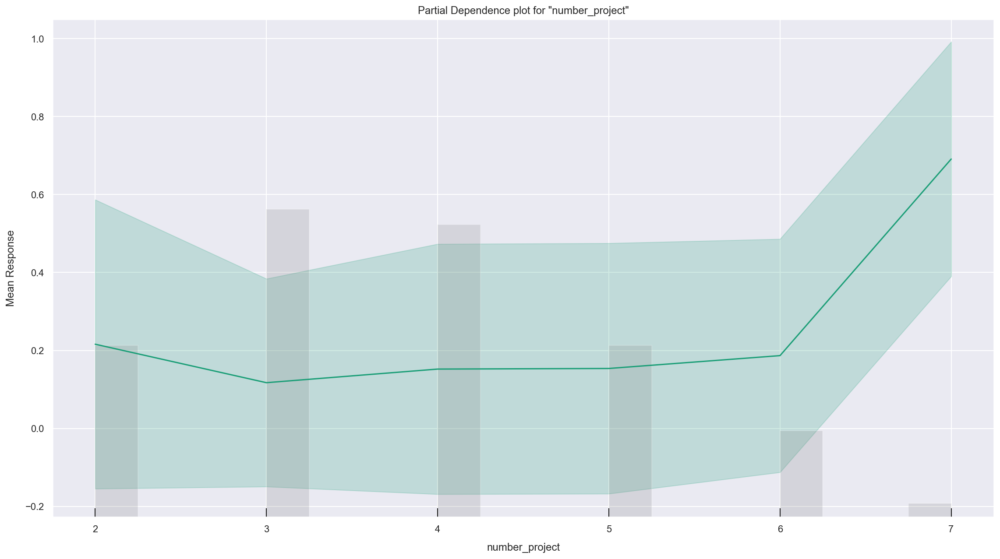

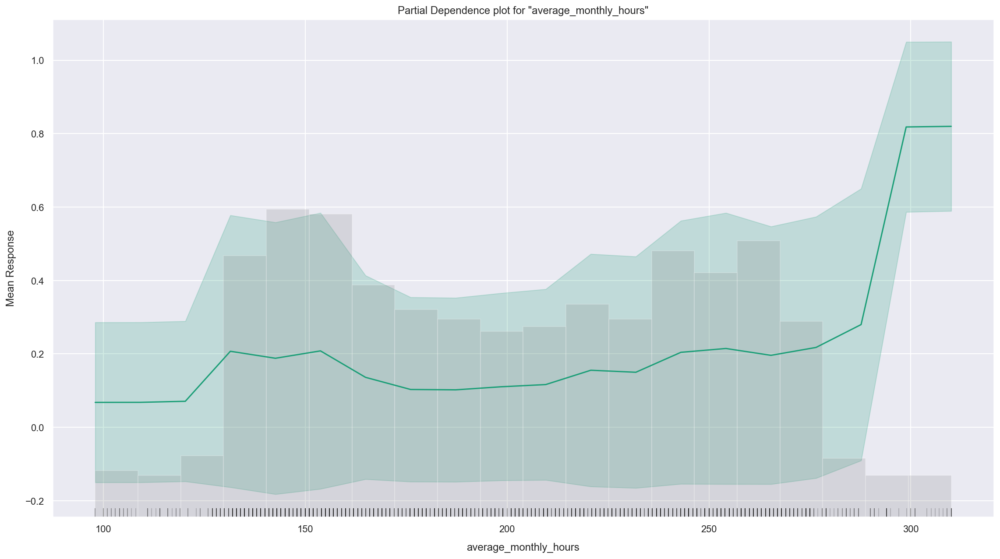

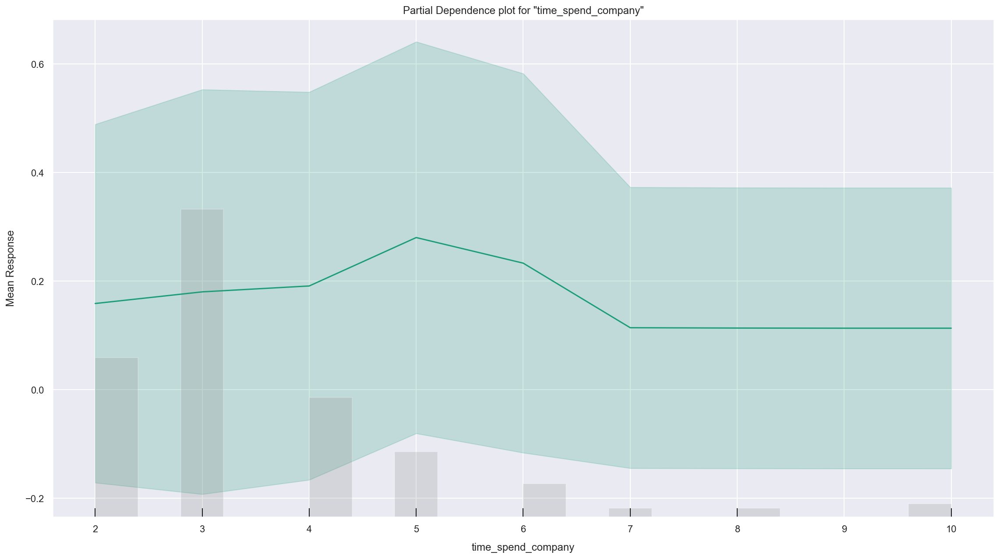

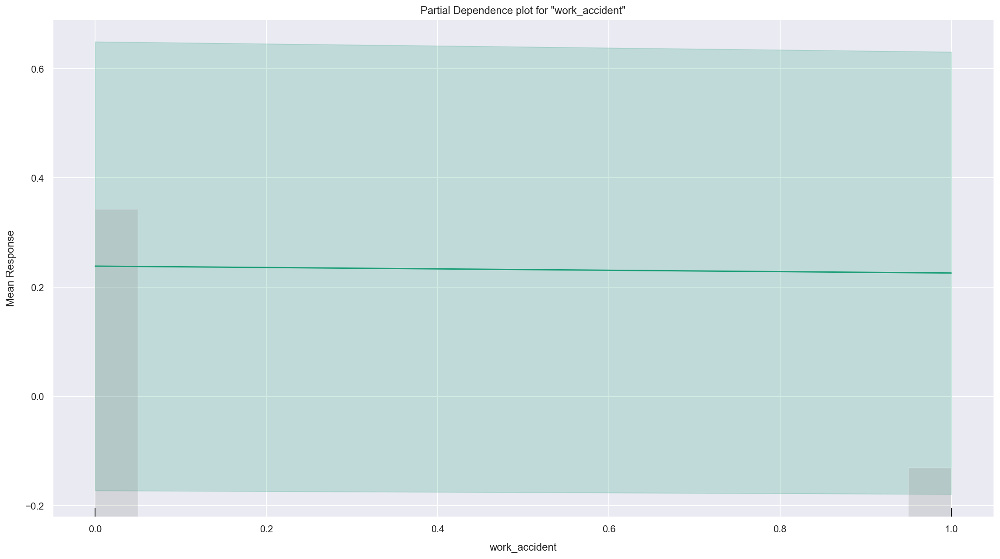

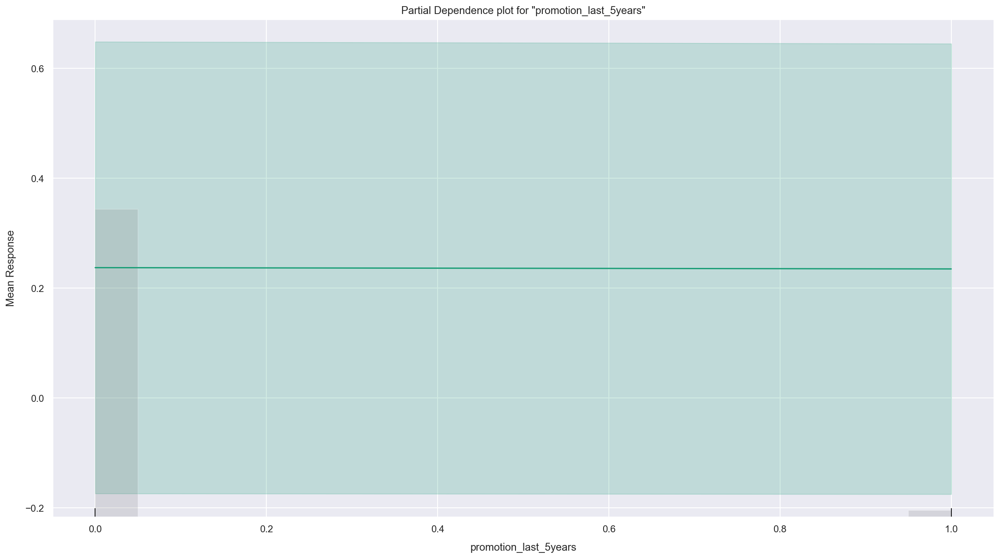

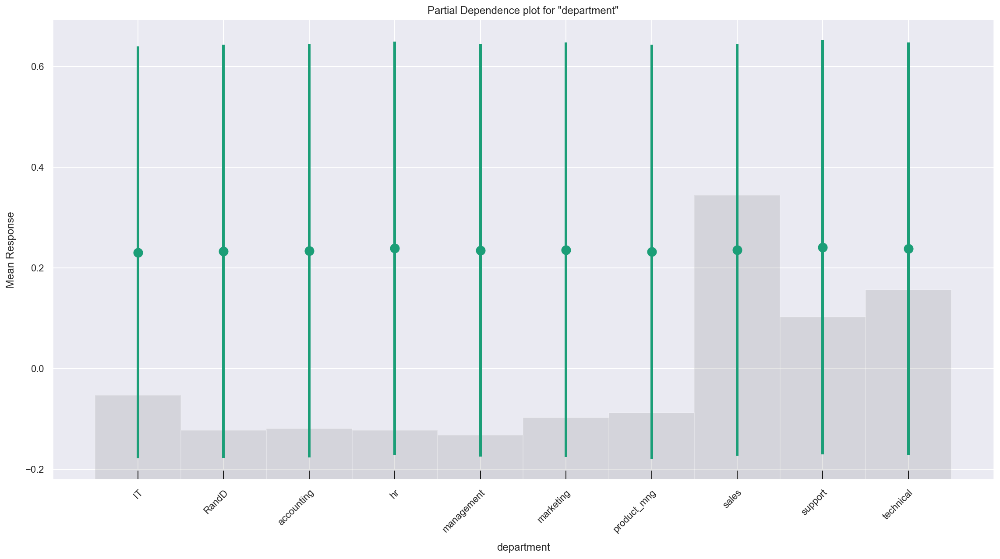

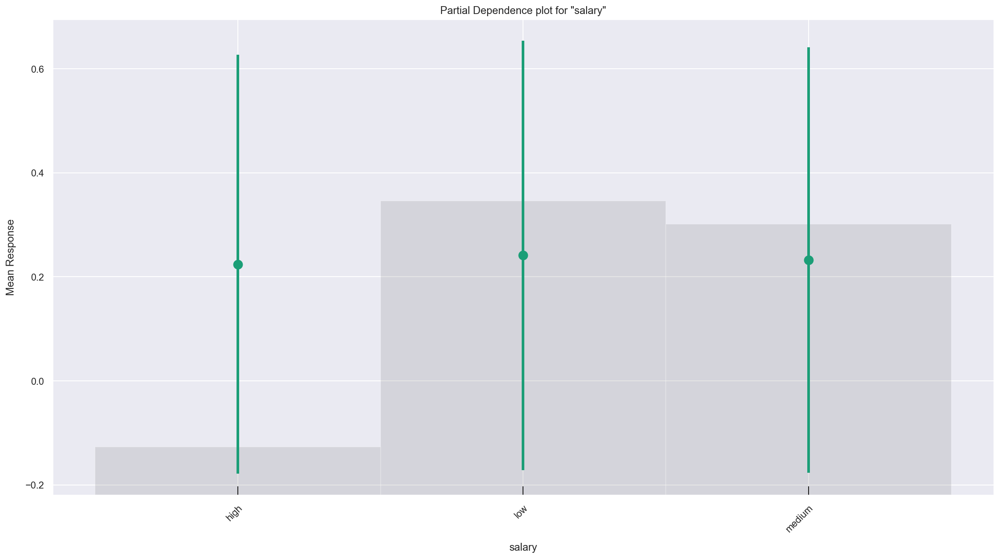

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_AutoML_20210413_181020


Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4906343685942352: 


,,no,yes,Error,Rate
0,no,7651.0,6.0,0.0008,(6.0/7657.0)
1,yes,3.0,2388.0,0.0013,(3.0/2391.0)
2,Total,7654.0,2394.0,0.0009,(9.0/10048.0)


# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

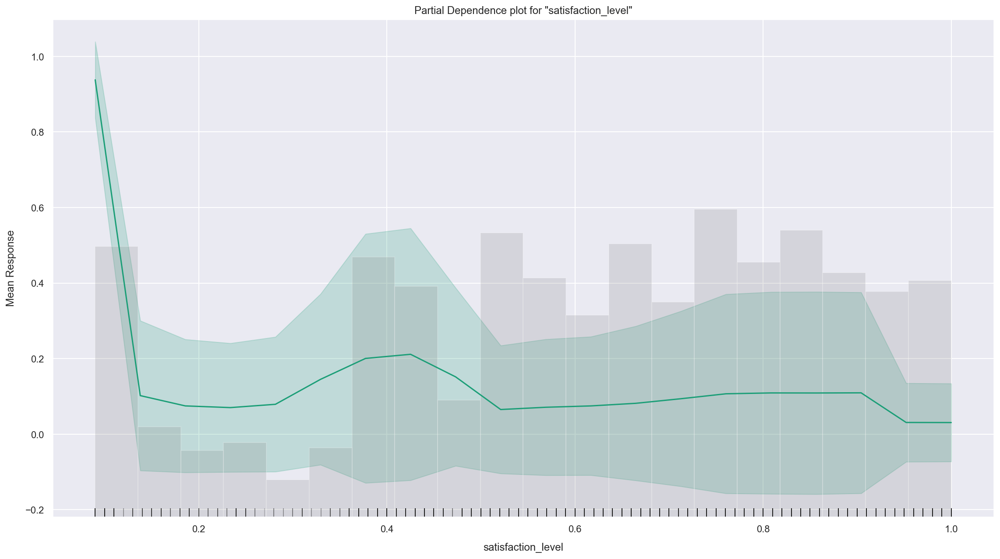

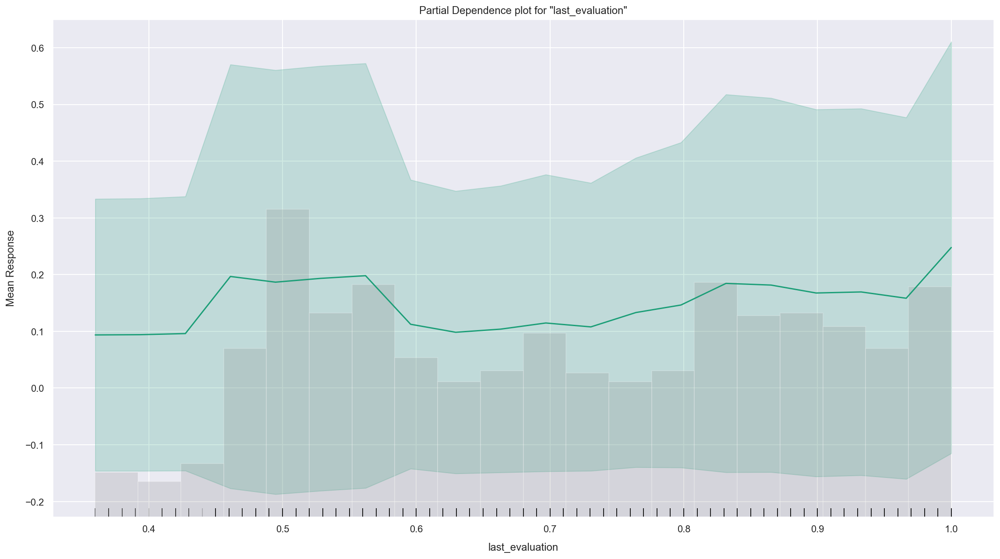

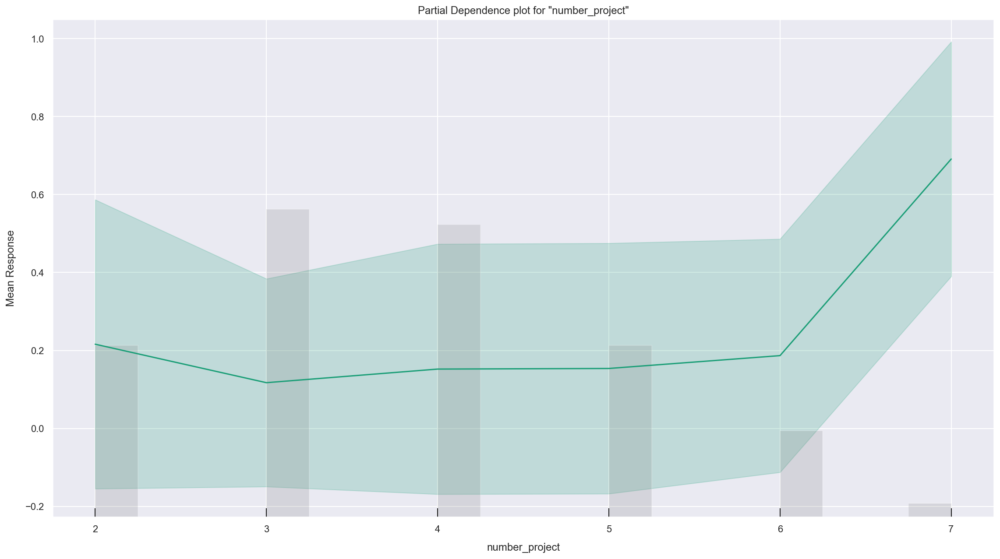

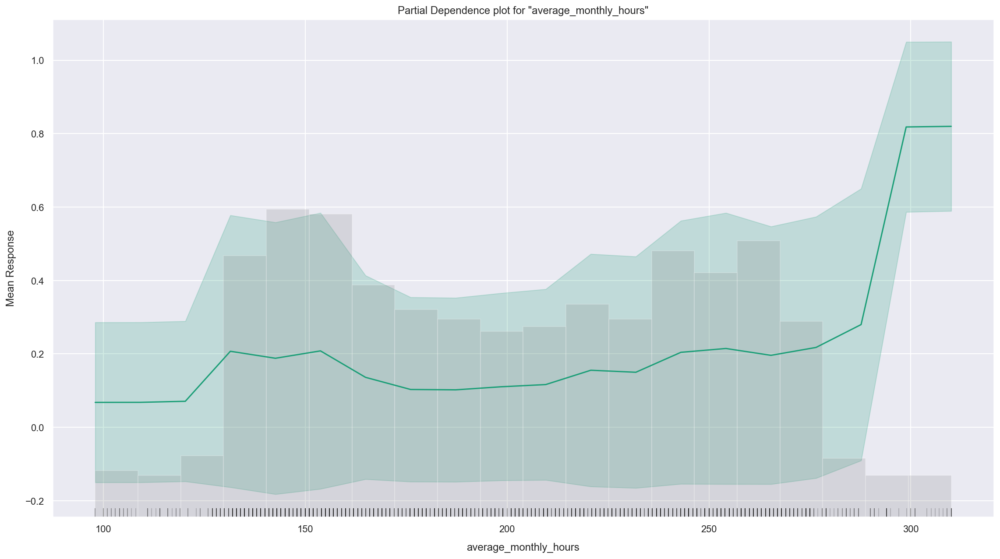

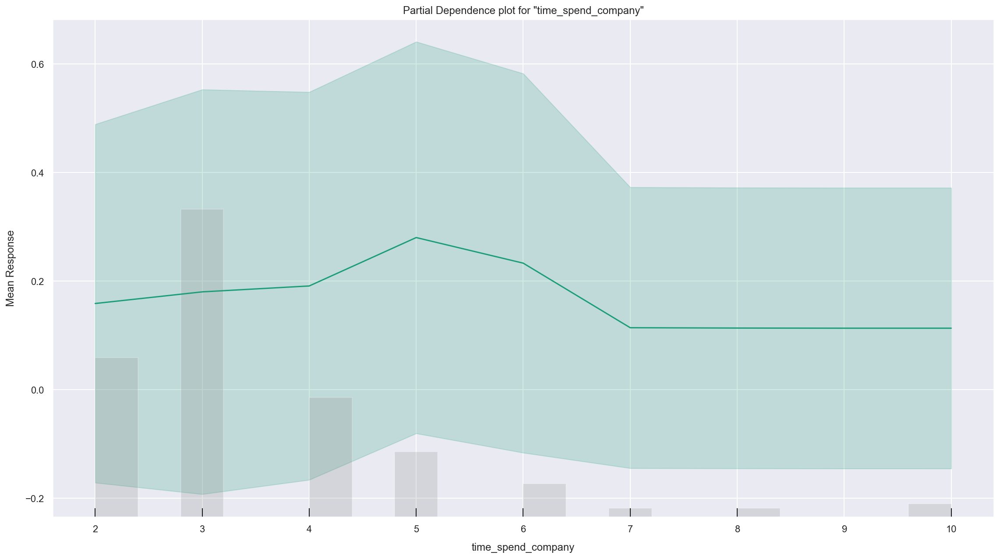

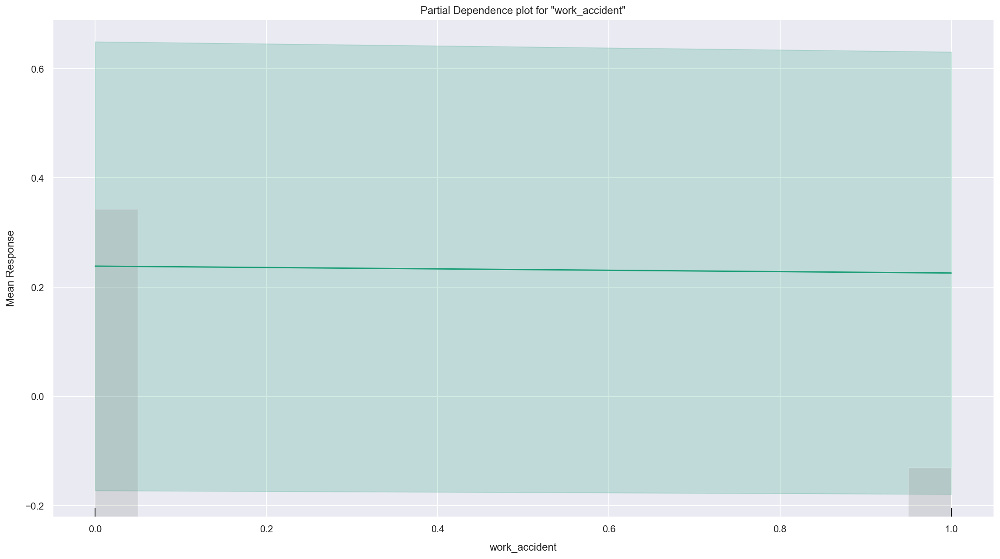

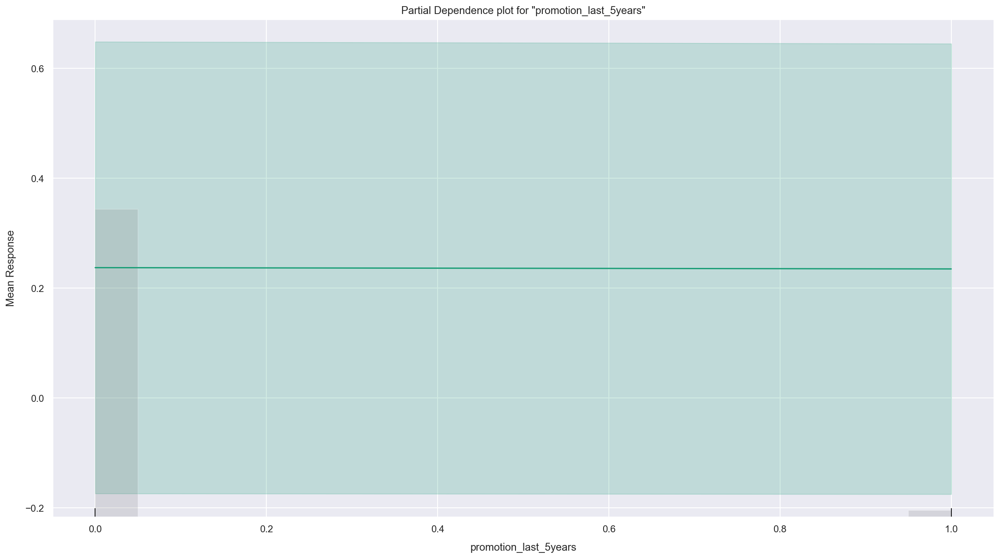

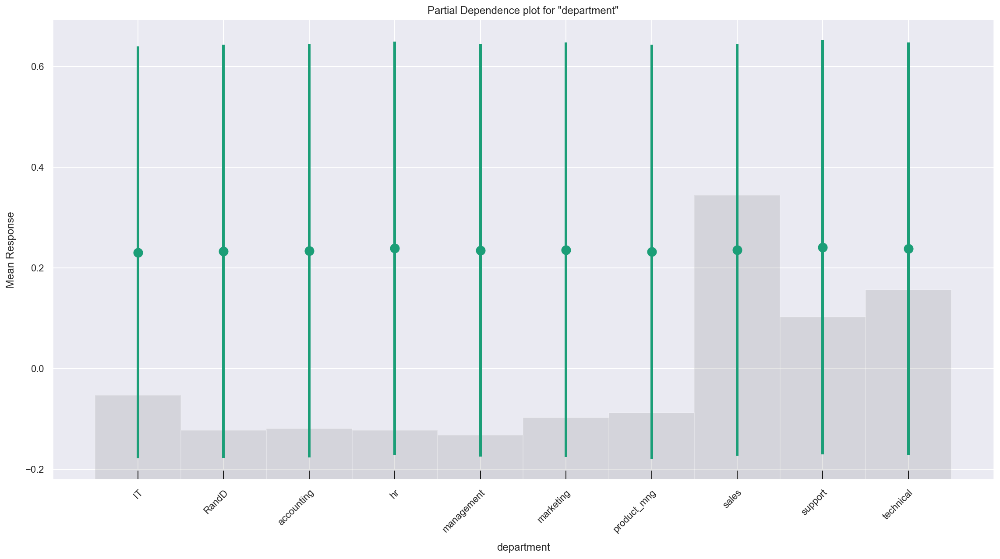

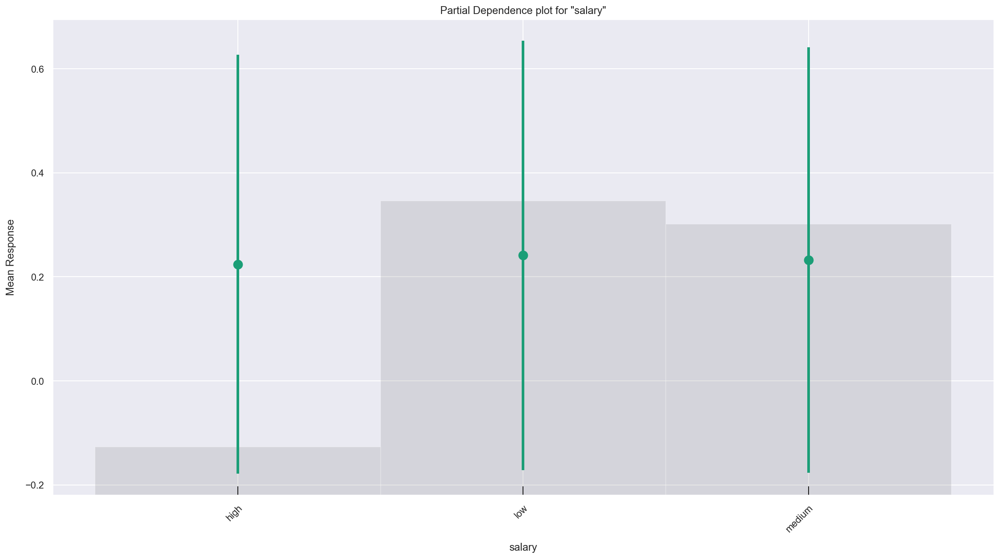

In [34]:
# Global Explanations
aml_leader_model = h2o.get_model("StackedEnsemble_BestOfFamily_AutoML_20210413_181020") # point to a single model
aml_leader_model.explain(test) # generate all plots 

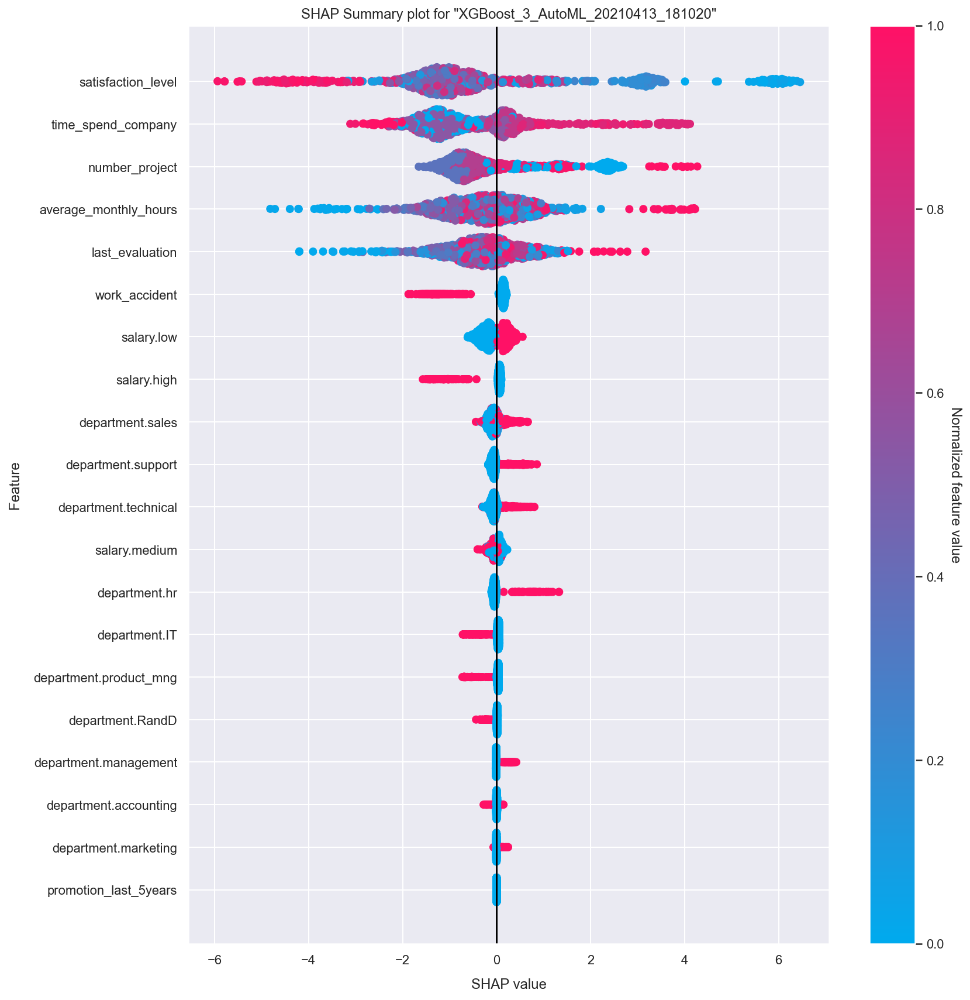

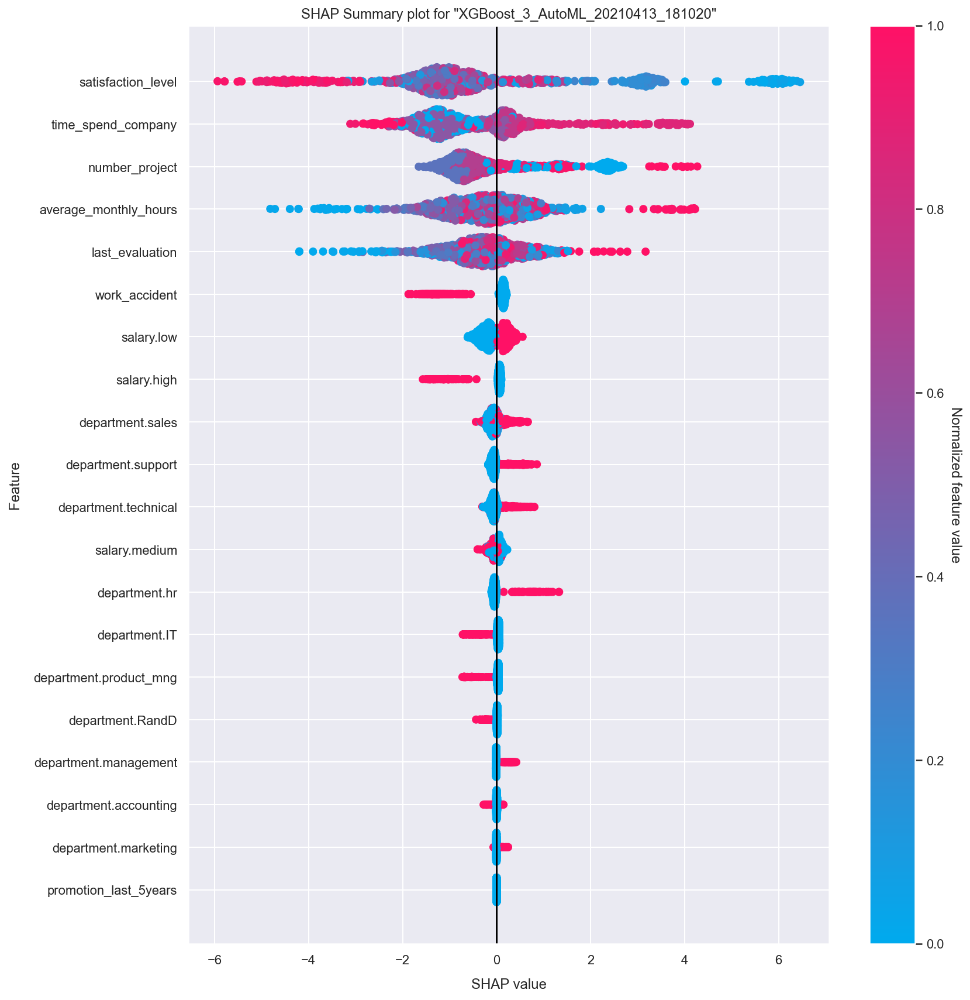

In [38]:
# API for Individual Plots
aml_select_model = h2o.get_model("XGBoost_3_AutoML_20210413_181020") # point to a single model
aml_select_model.shap_summary_plot(test)

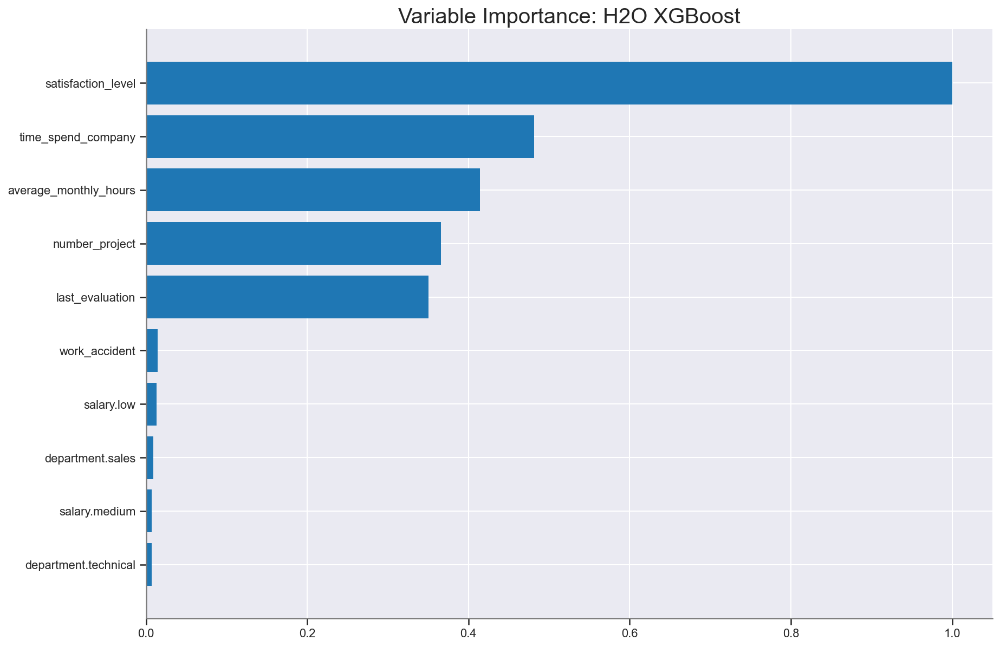

In [41]:
aml_select_model.varimp_plot()

In [44]:
aml_select_model.ice_plot(test)

TypeError: ice_plot() missing 1 required positional argument: 'column'

In [17]:
compareML = H2OAutoML(max_models = 18, seed = 42, max_runtime_secs = 400)
compareML.train(x = predictors, y = response, training_frame = hr_hx)

compareML.leaderboard

AutoML progress: |████████████████████████████████████████████████████████| 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_AutoML_20210413_180701,0.993919,0.0478876,0.989729,0.0188797,0.0996295,0.00992604
StackedEnsemble_BestOfFamily_AutoML_20210413_180701,0.993809,0.0484279,0.989512,0.018766,0.100363,0.0100728
GBM_grid__1_AutoML_20210413_180701_model_2,0.993678,0.051432,0.988997,0.0190984,0.100347,0.0100695
GBM_4_AutoML_20210413_180701,0.993345,0.0526003,0.988675,0.0187749,0.10219,0.0104428
XGBoost_grid__1_AutoML_20210413_180701_model_2,0.99334,0.0519384,0.988623,0.0191511,0.102028,0.0104096
GBM_2_AutoML_20210413_180701,0.993233,0.0530366,0.988594,0.0196235,0.103993,0.0108145
GBM_3_AutoML_20210413_180701,0.993139,0.0528337,0.988492,0.0207958,0.103933,0.0108021
GBM_1_AutoML_20210413_180701,0.993131,0.0538882,0.988349,0.0202186,0.10688,0.0114234
GBM_5_AutoML_20210413_180701,0.992949,0.0568021,0.98805,0.0200085,0.106942,0.0114366
XRT_1_AutoML_20210413_180701,0.992277,0.104624,0.986504,0.0280922,0.152042,0.0231166


In [18]:
# h2o.cluster().shutdown()

H2O session _sid_839b closed.
